In [1]:
cd ../src/train_VAE/

/home/rfit/Telescope_Array/phd_work/src/train_VAE


In [2]:
import h5py as h5
import numpy as np
import os
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm
# data_path = '/home3/rfit/Telescope_Array/phd_work/data/normed/pr_fe_q4_e1_0110_excl_sat_F_excl_geo_F.h5'
data_path = '/home3/rfit/Telescope_Array/phd_work/data/normed/pr_photon_q4_e1_0110_excl_sat_F_excl_geo_F.h5'
data_path = '/home3/rfit/Telescope_Array/phd_work/data/normed/pr_photon_0001_excl_sat_F_excl_geo_F.h5'

In [3]:
'''
mc_params (num_evs,10):
0. mc_event_num
1. mc_parttype (CORSIKA, 1 - gamma, 14 - proton, 5626 - Fe)
2. mc_corecounter, closest to core detector number
3. mc_E (for primaries other than photon energy is rescaled by 1/1.27, i.e. to proton FD energy scale)
4. mc_theta
5. mc_phi
6. mc_height_1st_inter, km
7. mc_xcore
8. mc_ycore
9. mc_border_distance, km 
'''
with h5.File(data_path,'r') as f:
    print('keys', list(f.keys()))
    test = f['test']
    keys = list(test.keys())
    mc_params = test['mc_params'][:]
    for k in keys:
        print(k, test[k].shape)

keys ['norm_param', 'test', 'train', 'val']
dt_mask (1143461, 2)
dt_params (26130485, 6)
ev_ids (1143461, 3)
ev_starts (1143462,)
mc_params (1143461, 10)
recos (1143461, 6)
wfs_flat (26130485, 128, 2)


In [559]:
try:
    import importlib
    importlib.reload(pipline)
except NameError:
    import pipline

Using device: cuda


In [560]:
config = 'config.yaml'
model = pipline.Pipline(config)
model.config['latent_dim'] = 16
chpt = "../../Models/AutoEncoder/Proton_train_lat=16/best"
model.load_chpt(chpt)

['pipline.py', '__pycache__', 'runs2', 'test', 'runs', 'datasets.py', 'runs_tests', 'model.py', 'test_particles', 'loss.py', 'tests', 'utils.py', 'init.sh', 'config.yaml', 'hists', '__init__.py', 'for_temporary_work', '.ipynb_checkpoints']
mc_params True
keys ['norm_param', 'test', 'train', 'val']
mc_params True
keys ['norm_param', 'test', 'train', 'val']
mc_params True
keys ['norm_param', 'test', 'train', 'val']
Encoder has params: 1097760 Decoder has params: 2406921
Saving Path: /home/rfit/Telescope_Array/phd_work/Models/AutoEncoder/Proton_train_lat=8_Pr+photon


In [10]:
latent_list, params, loss = model.predict_latent(write_embedding=False,
                                                NoneLoss = True)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 183/183 [00:33<00:00,  5.41it/s]


In [19]:
loss[10][0]

tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
        [5.4992e-01, 4.3591e-03, 0.0000e+00, 2.5607e-04, 4.0532e-01, 4.7314e-01],
        [1.8843e-02, 2.0625e-03, 0.0000e+00, 3.2685e-04, 1.3502e-02, 4.7221e-02],
        [1.1120e-02, 1.2910e-02, 0.0000e+00, 3.7852e-06, 2.0628e-03, 1.4392e-02],
        [2.5701e-05, 3.1292e-02, 0.0000e+00, 1.2007e-04, 3.1749e-03, 2.6240e-01],
        [2.6761e-02, 2.2790e-03, 0.0000e+00, 6.3191e-05, 2.1502e-03, 4.7528e-02],
        [8.5441e-03, 3.2546e-03, 0.0000e+00, 5.7278e-06, 2.4089e-03, 1.7991e-01],
        [3.1014e-03, 5.0226e-04, 0.0000e+00, 1.4588e-04, 1.3995e-02, 3.4415e-01],
        [9.9162e-02, 5.9101e-03, 0.0000e+00, 1.7623e-04, 6.4376e-02, 5.0908e+00],
        [3.5829e-02, 1.0400e-02, 0.0000e+00, 7.4924e-05, 7.4273e-03, 9.3087e-01],
        [3.3075e-02, 6.4085e-04, 0.0000e+00, 2.3725e-04, 4.8312e-04, 8.2727e-03],
        [7.6988e-02, 1.9681e-02, 0.0000e+00, 3.2318e-04, 1.1062e-03, 1.5076e+00],
        [1.6802e

In [558]:
len(loss), loss[0].shape

(573, torch.Size([2000, 76, 6]))

## Среднее значение функции потерь для сигнала и времен

In [63]:
num= 0
for i in loss:
    num+=i.shape[0]
num

1143461

In [68]:
loss_signal = torch.zeros(0,)
loss_time = torch.zeros(0,)
for batch in loss:
    loss_signal = torch.concat((loss_signal, batch[:,:,3][batch[:,:,3]>0]), dim=0)
    loss_time = torch.concat((loss_time, batch[:,:,5][batch[:,:,5]>0]), dim=0)
loss_signal.shape, loss_time.shape

(torch.Size([26130469]), torch.Size([26130484]))

In [70]:
loss_signal = torch.zeros(0,)
loss_time = torch.zeros(0,)
nums = 10
for batch in loss:
    loss_signal = torch.concat((loss_signal, batch[nums,:,3][batch[nums,:,3]>0]), dim=0)
    loss_time = torch.concat((loss_time, batch[nums,:,5][batch[nums,:,5]>0]), dim=0)
loss_signal.shape, loss_time.shape

(torch.Size([12917]), torch.Size([12917]))

Text(0.5, 0, 'loss_signal')

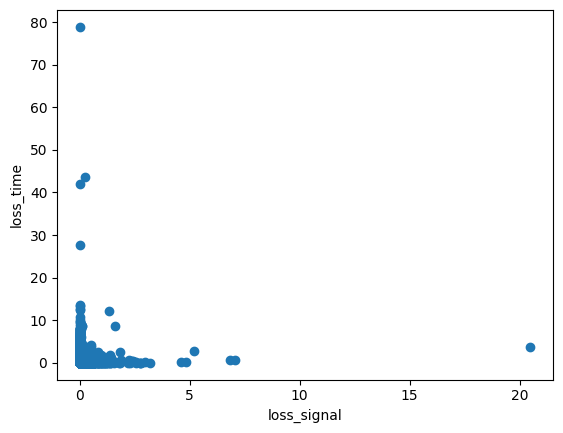

In [71]:
plt.scatter(loss_signal, loss_time)
plt.ylabel('loss_time')
plt.xlabel('loss_signal')

(-0.2, 5.0)

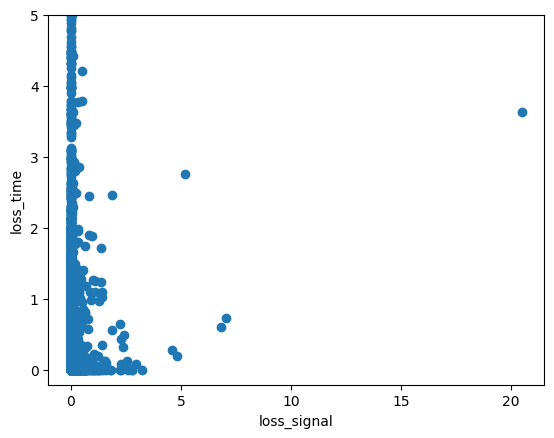

In [72]:
plt.scatter(loss_signal, loss_time)
plt.ylabel('loss_time')
plt.xlabel('loss_signal')
plt.ylim(-0.2,5)

(-0.05, 5.0)

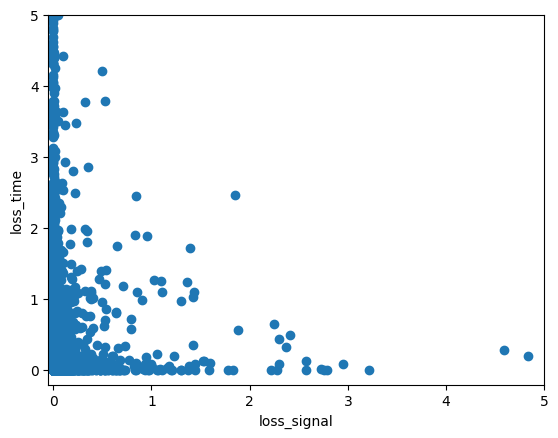

In [73]:
plt.scatter(loss_signal, loss_time)
plt.ylabel('loss_time')
plt.xlabel('loss_signal')
plt.ylim(-0.2,5)
plt.xlim(-0.05, 5)

In [74]:
#differet particle

In [87]:
loss[-1].shape

torch.Size([387, 49, 6])

In [123]:
loss_signal = {'pr':torch.zeros(0,), 'photon':torch.zeros(0,)}
loss_time = {'pr':torch.zeros(0,), 'photon':torch.zeros(0,)}
nums = 10
shape = 0
for i, batch in enumerate(loss):
    part = params[nums+ i*shape]
    shape = batch.shape[0]
    loss_signal[part] = torch.concat((loss_signal[part], batch[nums,:,3][batch[nums,:,3]>0]), dim=0)
    loss_time[part] = torch.concat((loss_time[part], batch[nums,:,5][batch[nums,:,5]>0]), dim=0)
# loss_signal.shape, loss_time.shape

IndexError: list index out of range

In [124]:
for part in ['pr','photon']:
    print(part, loss_signal[part].shape, loss_time[part].shape)

pr torch.Size([9559]) torch.Size([9559])
photon torch.Size([3348]) torch.Size([3348])


(-0.2, 5.0)

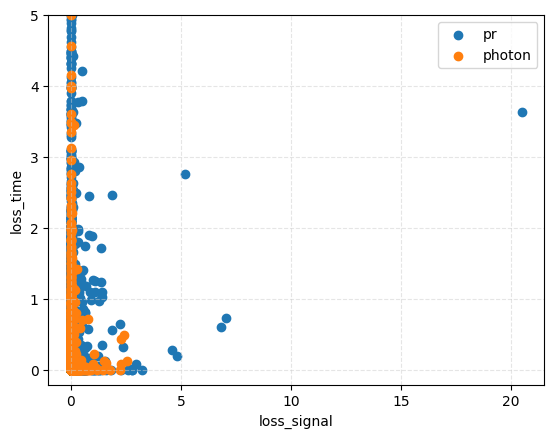

In [125]:
for part in ['pr','photon']:
    plt.scatter(loss_signal[part], loss_time[part], label=part)
plt.legend()
plt.ylabel('loss_time')
plt.xlabel('loss_signal')
plt.ylim(-0.2,5)
# plt.xlim(-0.05, 5)

(-0.05, 2.5)

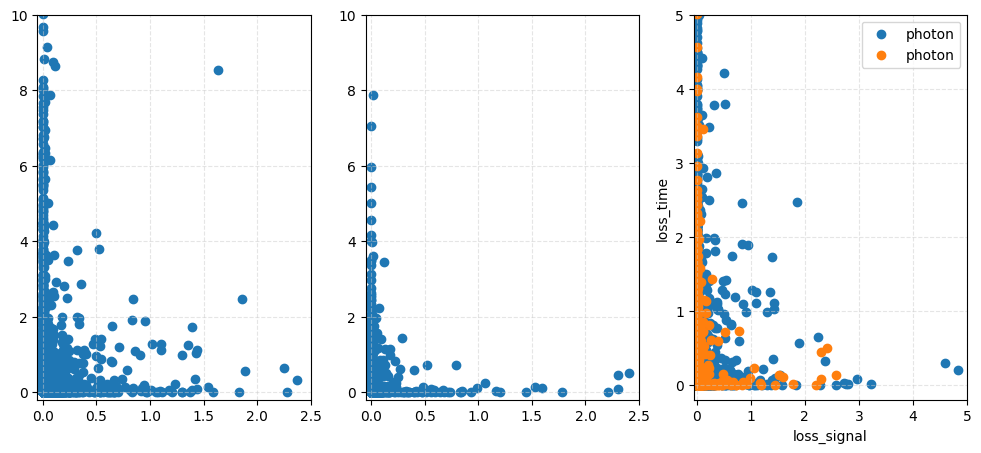

In [131]:
fig, axs= plt.subplots(1,3,figsize=(12,5))
axs[0].scatter(loss_signal['pr'], loss_time['pr'], label=part)

axs[1].scatter(loss_signal['photon'], loss_time['photon'], label=part)
axs[2].scatter(loss_signal['pr'], loss_time['pr'], label=part)

axs[2].scatter(loss_signal['photon'], loss_time['photon'], label=part)
plt.legend()
plt.ylabel('loss_time')
plt.xlabel('loss_signal')
plt.ylim(-0.2,5)
plt.xlim(-0.05, 5)

axs[0].set_ylim(-0.2,10)
axs[0].set_xlim(-0.05, 2.5)
axs[1].set_ylim(-0.2,10)
axs[1].set_xlim(-0.05, 2.5)
                      

In [291]:
counts

array([[2.48787788e+02, 3.93894044e+01, 1.81981443e+01, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [5.98623167e+00, 9.57797067e-01, 5.98623167e-01, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.79586950e+00, 2.39449267e-01, 2.39449267e-01, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])

In [102]:
plt.style.use('default')  # Сброс к стилю по умолчанию
plt.rcParams.update({
    'axes.grid': True,
    'grid.linestyle': '--',
    'grid.alpha': 0.5,
    'grid.color': '#cccccc',
    'axes.facecolor': 'white'
})

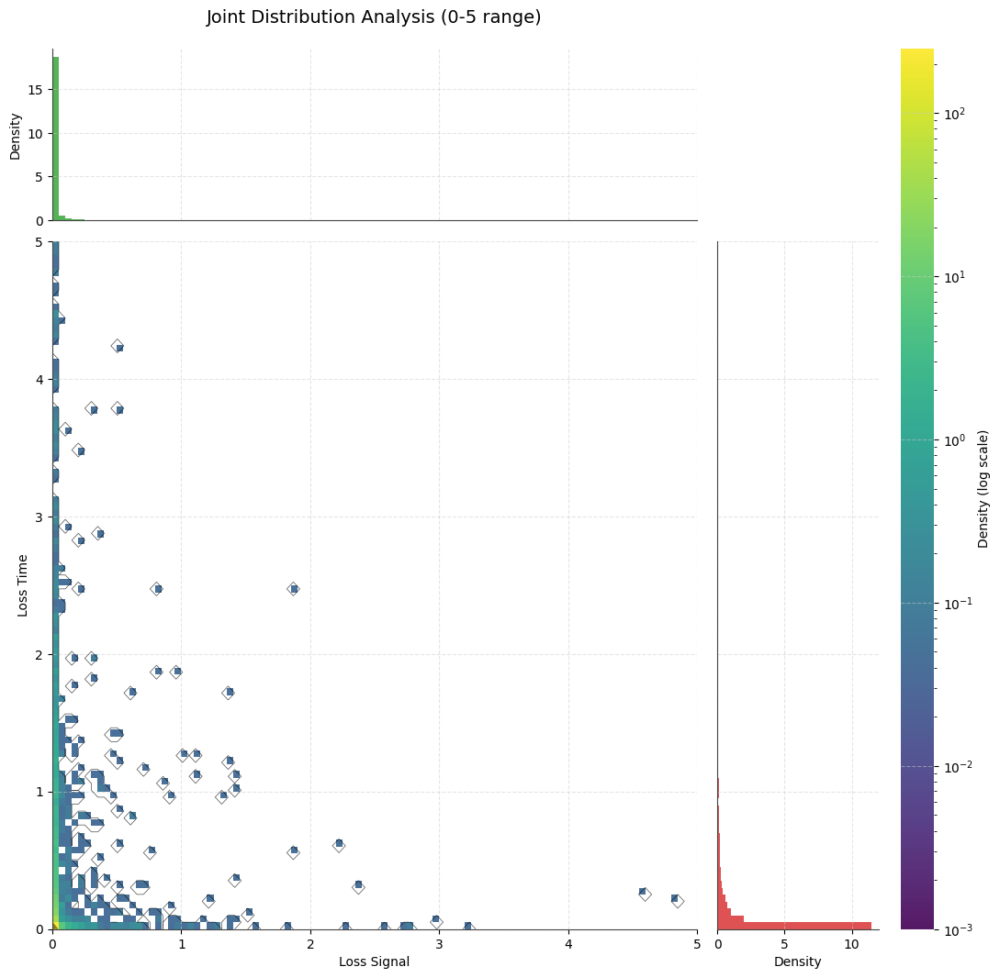

In [104]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LogNorm  # Для логарифмической шкалы цветов

# Настройка стиля
# plt.style.use('seaborn-whitegrid')
part = 'pr'

fig = plt.figure(figsize=(12, 12), facecolor='white')
gs = fig.add_gridspec(2, 2, 
                    width_ratios=(4, 1),
                    height_ratios=(1, 4),
                    left=0.1, right=0.85,
                    bottom=0.1, top=0.9,
                    wspace=0.05, hspace=0.05)

# Основная 2D гистограмма
ax_main = fig.add_subplot(gs[1, 0])
x = loss_signal[part].numpy()
y = loss_time[part].numpy()

bins = 100  # Увеличим количество бинов для детализации
range = [[0, 5], [0, 5]]

# Используем логическую нормализацию и минимальный порог
counts, xedges, yedges, im = ax_main.hist2d(
    x, y,
    bins=bins,
    range=range,
    density=True,
    cmap='viridis',
    norm=LogNorm(vmin=1e-3, vmax=counts.max()),  # Логарифмическая шкала цветов
    alpha=0.9
)

# Добавляем контуры для лучшей читаемости
ax_main.contour(
    counts.T, 
    extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
    levels=5,
    colors='black',
    linewidths=0.5,
    alpha=0.7
)

# Цветовая шкала
ax_cbar = fig.add_axes([0.87, 0.1, 0.03, 0.8])
cbar = fig.colorbar(im, cax=ax_cbar, label='Density (log scale)')
cbar.outline.set_visible(False)

# Маргинальные распределения
ax_top = fig.add_subplot(gs[0, 0], sharex=ax_main)
ax_top.hist(x, bins=xedges, density=True, color='#2ca02c', alpha=0.8, range=(0,5))
ax_top.set(ylabel='Density', facecolor='white')
ax_top.grid(True, linestyle='--', alpha=0.5)
ax_top.tick_params(axis='x', which='both', bottom=False, labelbottom=False)

ax_right = fig.add_subplot(gs[1, 1], sharey=ax_main)
ax_right.hist(y, bins=yedges, density=True, 
            orientation='horizontal', color='#d62728', alpha=0.8, range=(0,5))
ax_right.set(xlabel='Density', facecolor='white')
ax_right.grid(True, linestyle='--', alpha=0.5)
ax_right.tick_params(axis='y', which='both', left=False, labelleft=False)

# Настройка осей
ax_main.set(
    xlabel='Loss Signal', 
    ylabel='Loss Time',
    xlim=(0, 5),
    ylim=(0, 5),
    facecolor='white'
)

# Убираем рамки
for ax in [ax_main, ax_top, ax_right]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_color('#444444')
    ax.spines['left'].set_color('#444444')

ax_top.set_title('Joint Distribution Analysis (0-5 range)', pad=20, fontsize=14)

plt.show()

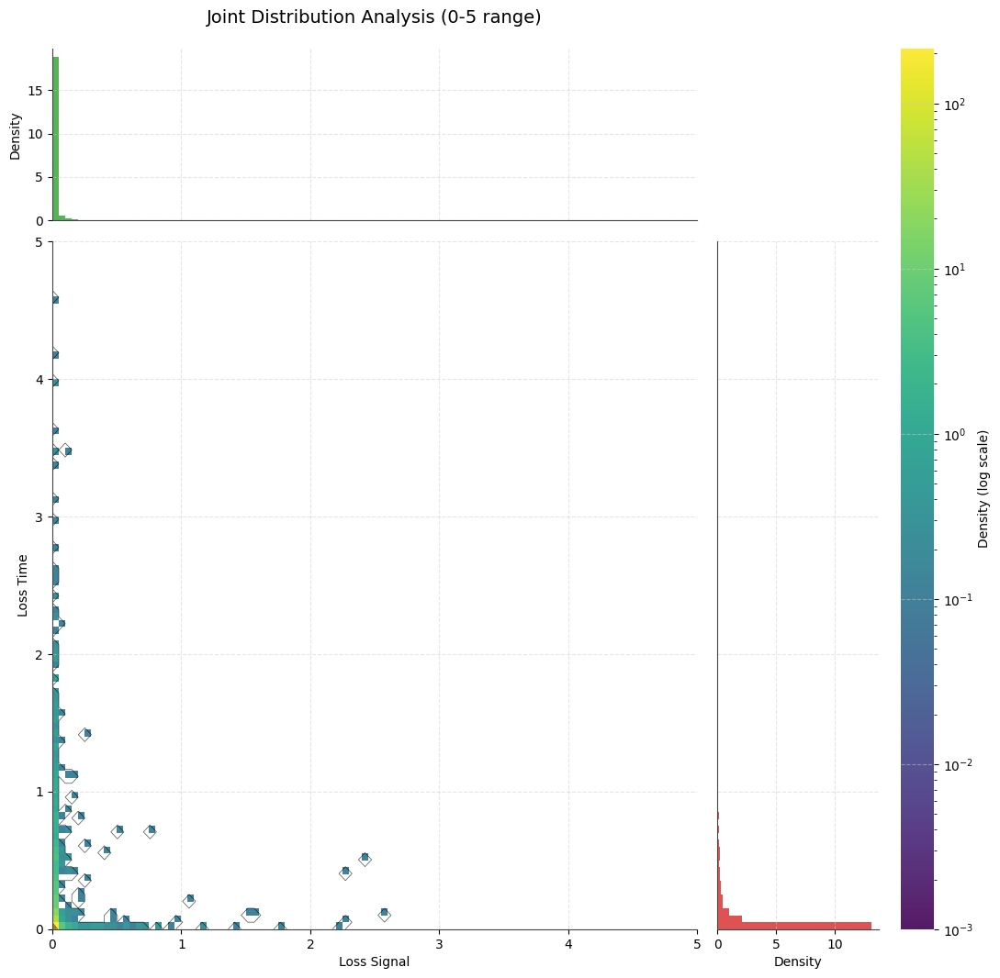

In [105]:
part = 'photon'
fig = plt.figure(figsize=(12, 12), facecolor='white')
gs = fig.add_gridspec(2, 2, 
                    width_ratios=(4, 1),
                    height_ratios=(1, 4),
                    left=0.1, right=0.85,
                    bottom=0.1, top=0.9,
                    wspace=0.05, hspace=0.05)

# Основная 2D гистограмма
ax_main = fig.add_subplot(gs[1, 0])
x = loss_signal[part].numpy()
y = loss_time[part].numpy()

bins = 100  # Увеличим количество бинов для детализации
range = [[0, 5], [0, 5]]

# Используем логическую нормализацию и минимальный порог
counts, xedges, yedges, im = ax_main.hist2d(
    x, y,
    bins=bins,
    range=range,
    density=True,
    cmap='viridis',
    norm=LogNorm(vmin=1e-3, vmax=counts.max()),  # Логарифмическая шкала цветов
    alpha=0.9
)

# Добавляем контуры для лучшей читаемости
ax_main.contour(
    counts.T, 
    extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
    levels=5,
    colors='black',
    linewidths=0.5,
    alpha=0.7
)

# Цветовая шкала
ax_cbar = fig.add_axes([0.87, 0.1, 0.03, 0.8])
cbar = fig.colorbar(im, cax=ax_cbar, label='Density (log scale)')
cbar.outline.set_visible(False)

# Маргинальные распределения
ax_top = fig.add_subplot(gs[0, 0], sharex=ax_main)
ax_top.hist(x, bins=xedges, density=True, color='#2ca02c', alpha=0.8, range=(0,5))
ax_top.set(ylabel='Density', facecolor='white')
ax_top.grid(True, linestyle='--', alpha=0.5)
ax_top.tick_params(axis='x', which='both', bottom=False, labelbottom=False)

ax_right = fig.add_subplot(gs[1, 1], sharey=ax_main)
ax_right.hist(y, bins=yedges, density=True, 
            orientation='horizontal', color='#d62728', alpha=0.8, range=(0,5))
ax_right.set(xlabel='Density', facecolor='white')
ax_right.grid(True, linestyle='--', alpha=0.5)
ax_right.tick_params(axis='y', which='both', left=False, labelleft=False)

# Настройка осей
ax_main.set(
    xlabel='Loss Signal', 
    ylabel='Loss Time',
    xlim=(0, 5),
    ylim=(0, 5),
    facecolor='white'
)

# Убираем рамки
for ax in [ax_main, ax_top, ax_right]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_color('#444444')
    ax.spines['left'].set_color('#444444')

ax_top.set_title('Joint Distribution Analysis (0-5 range)', pad=20, fontsize=14)

plt.show()

pr
signal 0.02609877 0.27876294
time 0.29370216 1.0433782
signal/time 186763730.0 14516157000.0


photon
signal 0.01924625 0.1279674
time 0.18106692 1.4455075
signal/time 3676223.2 163983120.0




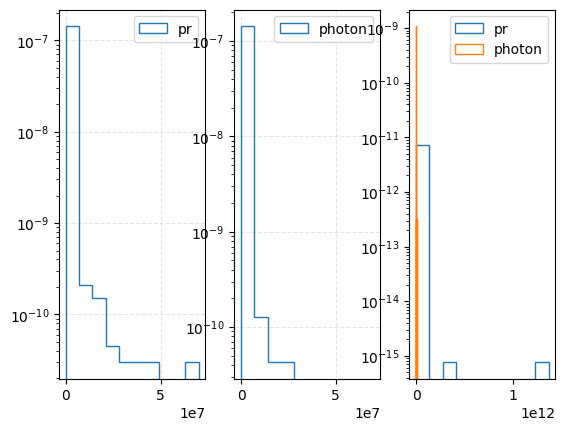

In [122]:
# 
fig, axs = plt.subplots(1,3)
particles = ['pr', 'photon']
for part in particles:
    x = loss_signal[part].numpy()
    y = loss_time[part].numpy()
    print(part)
    print('signal', x.mean(), x.std())
    print('time', y.mean(), y.std())
    z=y/x
    print('signal/time', z.mean(), z.std())
    print('\n')
    if part == 'pr':
        axs[0].hist(z, histtype = 'step',range=(0,7e7),  label = part, log=True, density=True)
    else:
        axs[1].hist(z, histtype = 'step', range=(0,7e7), label = part, log=True, density=True)
    axs[2].hist(z, histtype = 'step', label = part, log=True, density=True)
axs[0].legend()
axs[1].legend()
plt.legend()
plt.grid()

## detctor dist

In [66]:
'''
mc_params (num_evs,10):
0. mc_event_num
1. mc_parttype (CORSIKA, 1 - gamma, 14 - proton, 5626 - Fe)
2. mc_corecounter, closest to core detector number
3. mc_E (for primaries other than photon energy is rescaled by 1/1.27, i.e. to proton FD energy scale)
4. mc_theta
5. mc_phi
6. mc_height_1st_inter, kmloss_time[part]
7. mc_xcore
8. mc_ycore
9. mc_border_distance, km 
'''
mc_params.shape

(1143461, 10)

In [146]:
theta = mc_params[:,4]/180*3,1415
phi = mc_params[:,5]/180*3,1415
# почемуто тьюпл
theta =theta[0]
phi= phi[0]

(array([ 18739.,  57292.,  83888., 107942., 153502., 174415., 200923.,
        206549., 137134.,   3077.]),
 array([0.00628473, 0.11387843, 0.22147212, 0.32906581, 0.43665951,
        0.5442532 , 0.65184689, 0.75944059, 0.86703428, 0.97462797,
        1.08222167]),
 <BarContainer object of 10 artists>)

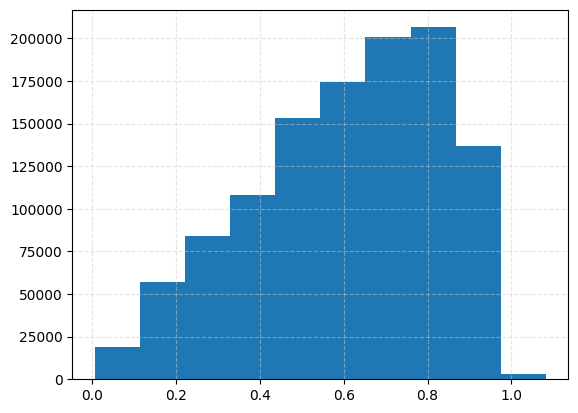

In [147]:
plt.hist(theta)

In [152]:
import numpy as np
# в коде реконтрукции

#n=-tf.concat([tf.math.cos(phi)*tf.math.sin(theta),tf.math.sin(phi)*tf.math.sin(theta),tf.math.cos(theta)],axis=-1)
def distant(x, y, th, phi):
    """
    Вычисляет расстояние от точки (x, y, 0) до прямой, проходящей через начало координат
    с направлением, заданным сферическими углами th (θ) и phi (φ)
    
    Параметры:
    x, y - координаты точки в плоскости XY
    th - полярный угол (от оси Z) в радианах (0 ≤ th ≤ π/2)
    phi - азимутальный угол в радианах (0 ≤ phi < 2π)
    
    Возвращает:
    Расстояние от точки до прямой
    """
    # Направляющий вектор прямой
    direction = np.array([
        np.sin(th) * np.cos(phi),
        np.sin(th) * np.sin(phi),
        np.cos(th)
    ])
    
    # Вектор из начала координат к точке (x, y, 0)
    point_vector = np.array([x, y, 0])
    
    # Вычисляем векторное произведение
    cross_product = np.cross(point_vector, direction)
    
    # Расстояние равно длине векторного произведения (так как direction - единичный вектор)
    return np.linalg.norm(cross_product)

In [153]:
distant(10, 10, 3.1415/4, 3.1415)

12.247921508134999

Кажется верно!!!


In [154]:
theta.shape

(1143461,)

In [157]:
loss_per_ev = []
for l_batch in loss:
    for l_ev in l_batch:
        loss_per_ev.append(l_ev)
len(loss_per_ev)

1143461

In [160]:
loss_all = {'pr', torch.zeros(0,),
           'photon', torch.zeros(0,)}
dist_all = {'pr', torch.zeros(0,),
           'photon', torch.zeros(0,)}

In [158]:
loss_per_ev[0]

tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
        [1.1020e-02, 1.2076e-03, 0.0000e+00, 5.0560e-07, 1.2554e-02, 1.5839e-03],
        [1.7050e-03, 4.4510e-04, 0.0000e+00, 8.6123e-05, 4.6568e-03, 4.4799e-04],
        [1.3551e-03, 2.4280e-02, 0.0000e+00, 3.7493e-04, 1.2725e-04, 1.0300e-02],
        [1.8374e-03, 3.0484e-02, 0.0000e+00, 1.0539e-05, 2.7252e-03, 7.1739e-03],
        [3.3633e-03, 2.0968e-02, 0.0000e+00, 8.6044e-04, 4.7906e-03, 2.7522e-05],
        [3.9920e-03, 8.1048e-02, 0.0000e+00, 1.9671e-04, 2.8094e-02, 8.7722e-03],
        [6.9901e-04, 7.2807e-03, 0.0000e+00, 1.9269e-05, 2.9315e-02, 3.2728e-02],
        [1.1328e-02, 3.1138e-02, 0.0000e+00, 2.1964e-04, 1.2281e-02, 5.0233e-03],
        [7.2089e-03, 4.5353e-05, 0.0000e+00, 2.9855e-06, 1.5083e-02, 6.5908e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
        [0.0000e

In [183]:
x_per_ev = []
particles_num = []
for i in [0,1]:
    k=0
    for x_bathc, part, _ in tqdm(model.val_loaders[i]):
        k+=x_bathc.shape[0]
        for x in x_bathc:
            x_per_ev.append(x)
    particles_num.append(k)
particles_num

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 183/183 [00:15<00:00, 12.08it/s]


[779074, 364387]

In [186]:
particles = torch.zeros(particles_num[0])
particles = torch.concat((particles, torch.ones(particles_num[1])))
particles.shape

torch.Size([1143461])

In [173]:
len(x_per_ev)

1143461

In [ ]:
particles[:3], particles[-3:]

In [407]:
data_dist_loss = torch.zeros(0,9)

In [408]:
particles

tensor([0., 0., 0.,  ..., 1., 1., 1.])

In [409]:
for i, l_detect in tqdm(enumerate(loss_per_ev), total=len(loss_per_ev)):
    if i%100 !=0:
        continue
    data = x_per_ev[i]
    x=data[0]
    y=data[1]
    theta_ev = theta[i]
    phi_ev = phi[i]
    loss_ev = loss_per_ev[i]
    p=particles[i]
    # too long time (about 14 h.)
    for j, det in enumerate(data):
        x=det[0]
        y=det[1]
        sig=det[3]
        dist = distant(x, y, theta_ev, phi_ev)
        l = loss_ev[j]
        info = torch.tensor([dist, l[0],l[1],l[2],l[3],l[4],l[5], p, sig]).unsqueeze(0)
        data_dist_loss = torch.concat((data_dist_loss, info), dim=0)
data_dist_loss.shape

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1143461/1143461 [40:34<00:00, 469.64it/s]


torch.Size([797650, 9])

In [486]:
part = 'photon'
def D2hist(x_data, y_data, part, x_name, y_name, xlim=(0,6), ylim=(1,50), ylog = True, xlog = False, bins=1000):
    import matplotlib.pyplot as plt
    import numpy as np
    from matplotlib.colors import LogNorm  # Для логарифмической шкалы цветов
    plt.style.use('default')  # Сброс к стилю по умолчанию
    plt.rcParams.update({
        'axes.grid': True,
        'grid.linestyle': '--',
        'grid.alpha': 0.5,
        'grid.color': '#cccccc',
        'axes.facecolor': 'white'
    })
    fig = plt.figure(figsize=(12, 12), facecolor='white')
    gs = fig.add_gridspec(2, 2, 
                        width_ratios=(4, 1),
                        height_ratios=(1, 4),
                        left=0.1, right=0.85,
                        bottom=0.1, top=0.9,
                        wspace=0.05, hspace=0.05)
    
    # Основная 2D гистограмма
    ax_main = fig.add_subplot(gs[1, 0])
    x = x_data.numpy()
    y = y_data.numpy()
    
    bins = bins  # Увеличим количество бинов для детализации
    # range = [[0, 5], [0, 5]]
    range_ = (None, None)
    
    # Используем логическую нормализацию и минимальный порог
    counts, xedges, yedges, im = ax_main.hist2d(
        x, y,
        bins=bins,
        range = None,
        density=True,
        cmap='viridis',
        norm=LogNorm(),  # Логарифмическая шкала цветов
        alpha=0.9
    )
    
    # Добавляем контуры для лучшей читаемости
    ax_main.contour(
        counts.T, 
        extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
        levels=10,
        colors='black',
        linewidths=0.5,
        alpha=0.7
    )
    
    # Цветовая шкала
    ax_cbar = fig.add_axes([0.87, 0.1, 0.03, 0.8])
    cbar = fig.colorbar(im, cax=ax_cbar, label='Density (log scale)')
    cbar.outline.set_visible(False)
    
    # Маргинальные распределения
    ax_top = fig.add_subplot(gs[0, 0], 
                             sharex=ax_main
                            )
    ax_top.hist(x, bins=xedges, density=True, color='#2ca02c', alpha=0.8)
    ax_top.set(ylabel=f'Density {x_name}', facecolor='white')
    ax_top.grid(True, linestyle='--', alpha=0.5)
    ax_top.tick_params(axis='x', which='both', bottom=False, labelbottom=False)
    
    ax_right = fig.add_subplot(gs[1, 1],
                               sharey=ax_main
                              )
    ax_right.hist(y, bins=yedges, density=True, orientation = 'horizontal',
                color='#d62728', alpha=0.8, log=True)
    ax_right.set(xlabel=f'Density {y_name}', facecolor='white')
    ax_right.grid(True, linestyle='--', alpha=0.5)
    ax_right.tick_params(axis='y', which='both', left=False, labelleft=False)
    
    # Настройка осей
    ax_main.set(
        xlabel=x_name, 
        ylabel=y_name,
        xlim=xlim,
        ylim=ylim,
        facecolor='white'
    )
    if ylog:
        ax_main.set_yscale('log')
    if xlog:
        ax_main.set_xscale('log')
    
    # Убираем рамки
    for ax in [ax_main, ax_top, ax_right]:
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_color('#444444')
        ax.spines['left'].set_color('#444444')
    
    ax_top.set_title(part + 'len: ' + str(len(x_data)), pad=20, fontsize=14)
    
    plt.show()

Text(0, 0.5, 'loss')

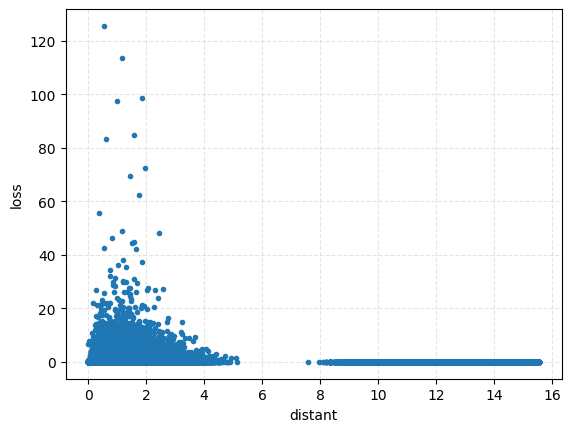

In [399]:
plt.plot(data_dist_loss[:,0], data_dist_loss[:,1] + data_dist_loss[:,2], '.')
plt.xlabel('distant')
plt.ylabel('loss')

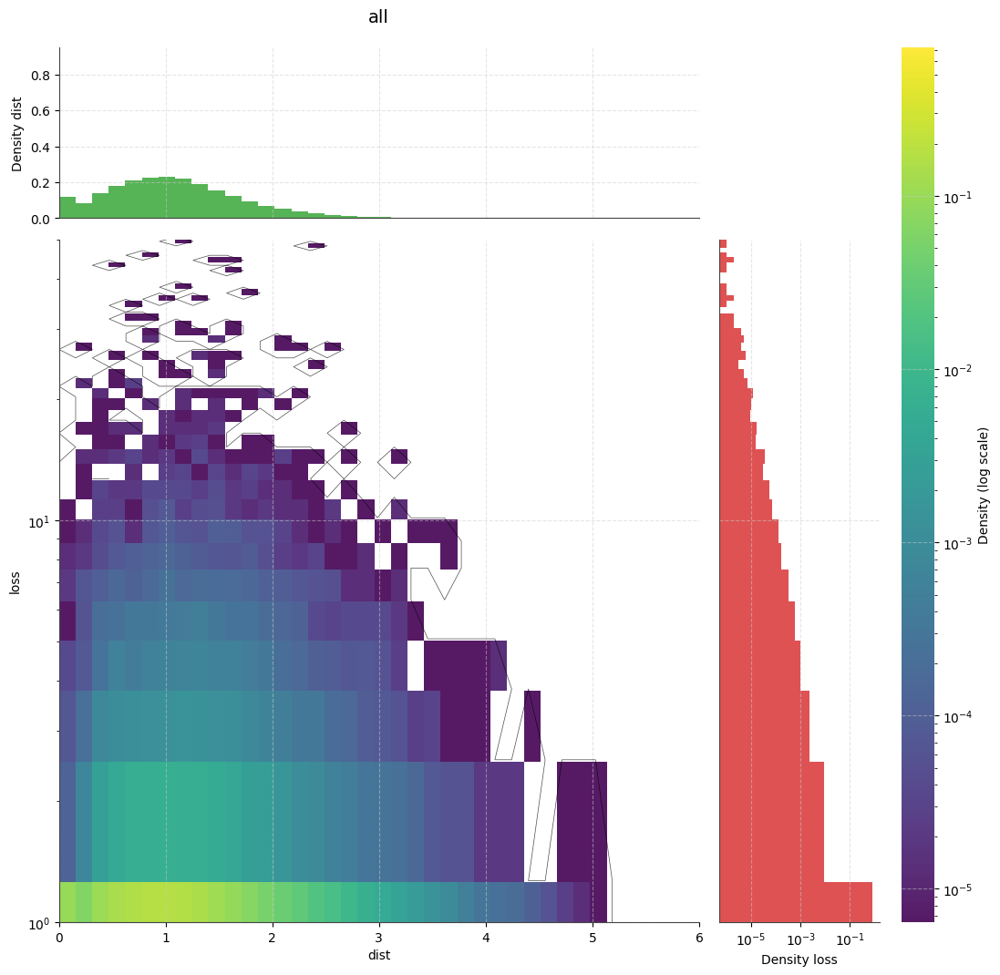

In [400]:
D2hist(data_dist_loss[:,0], data_dist_loss[:,1] + data_dist_loss[:,2], 'all', 'dist','loss') 

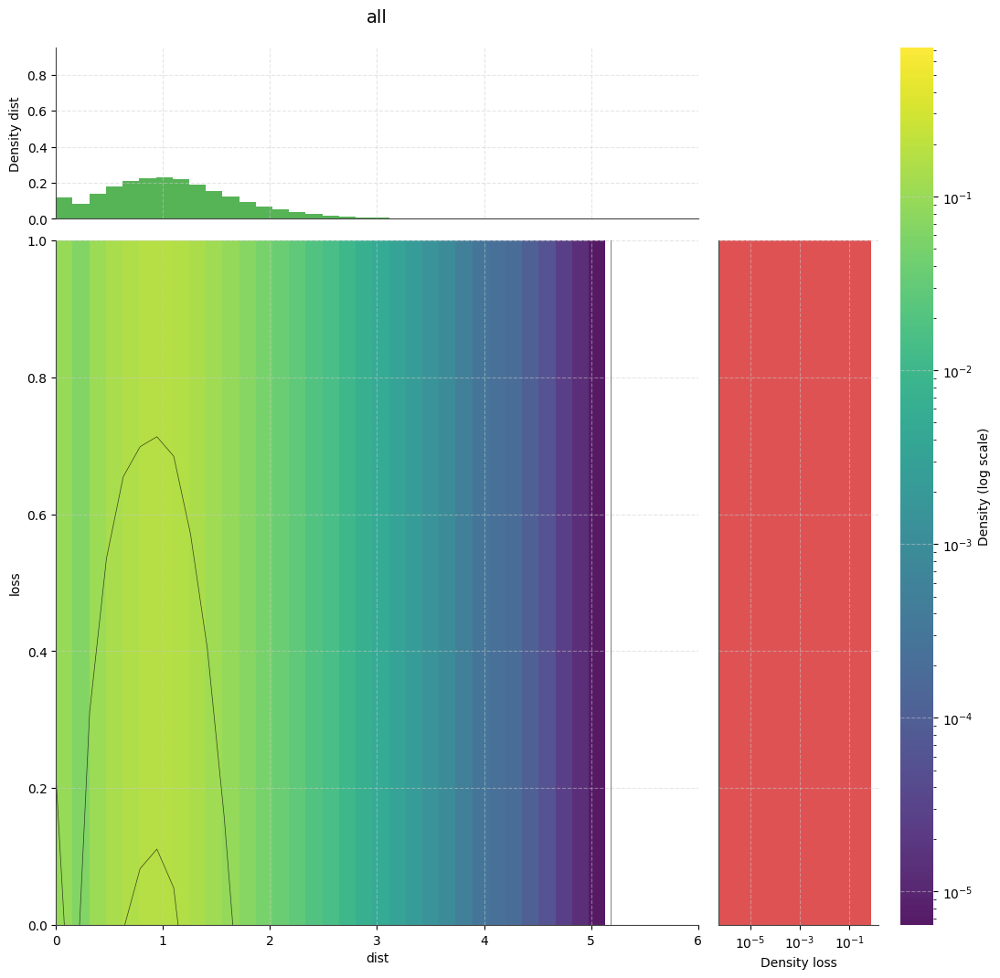

In [403]:
D2hist(data_dist_loss[:,0], data_dist_loss[:,1] + data_dist_loss[:,2], 'all', 'dist','loss', ylim=(0,1), ylog=False) 

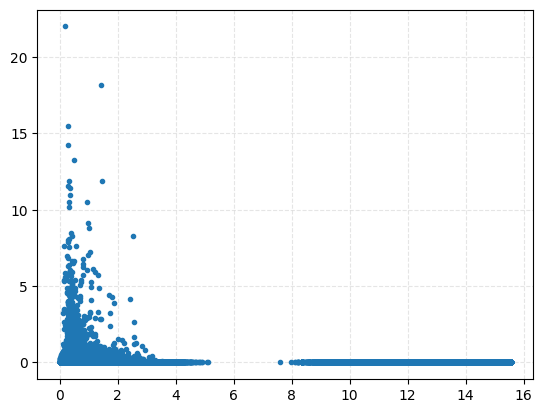

In [340]:
plt.plot(data_dist_loss[:,0], data_dist_loss[:,1], '.')

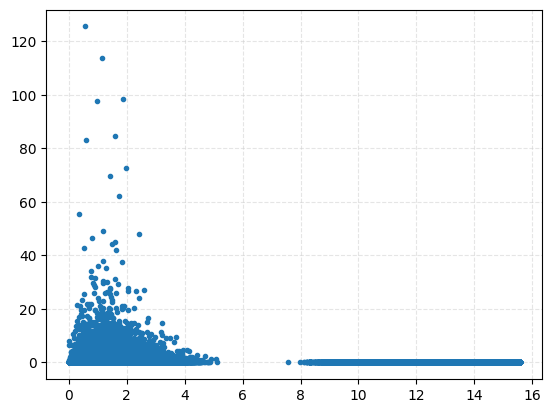

In [213]:
plt.plot(data_dist_loss[:,0], data_dist_loss[:,2], '.')

In [214]:
data_dist_loss[data_dist_loss[:,3]>0].shape

torch.Size([203336, 5])

(-1.0, 6.0)

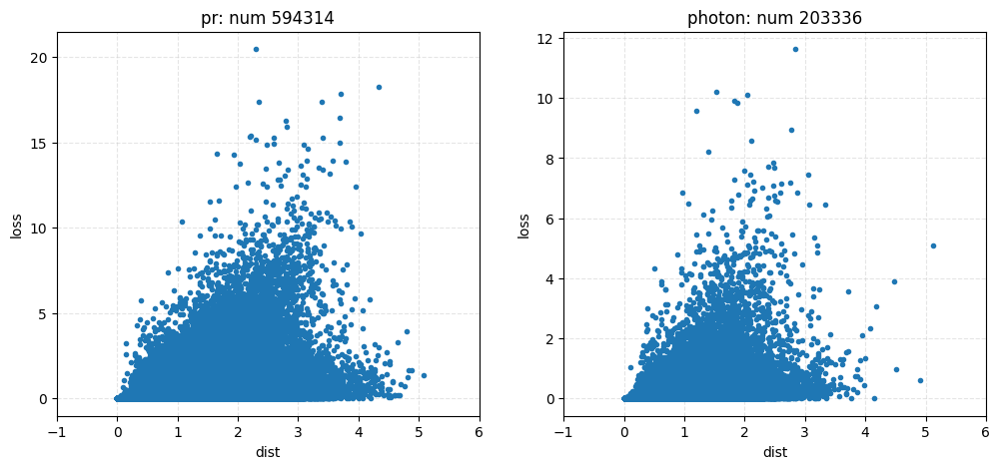

In [413]:
# ([dist, l[0],l[1],l[2],l[3],l[4],l[5], p, sig])
pr=data_dist_loss[data_dist_loss[:,-2]==0]
photon = data_dist_loss[data_dist_loss[:,-2]>0]
fig, axs = plt.subplots(1,2, figsize = (12,5))
axs[0].plot(pr[:,0], pr[:,1] + pr[:,2], '.')
axs[0].set_xlabel('dist')
axs[0].set_ylabel('loss')
axs[0].set_title(f'pr: num {len(pr)}')
axs[1].plot(photon[:,0], photon[:,1] + photon[:,2], '.')
axs[1].set_xlabel('dist')
axs[1].set_ylabel('loss')
axs[1].set_title(f'photon: num {len(photon)}')
axs[0].set_xlim(-1,6)
axs[1].set_xlim(-1,6)

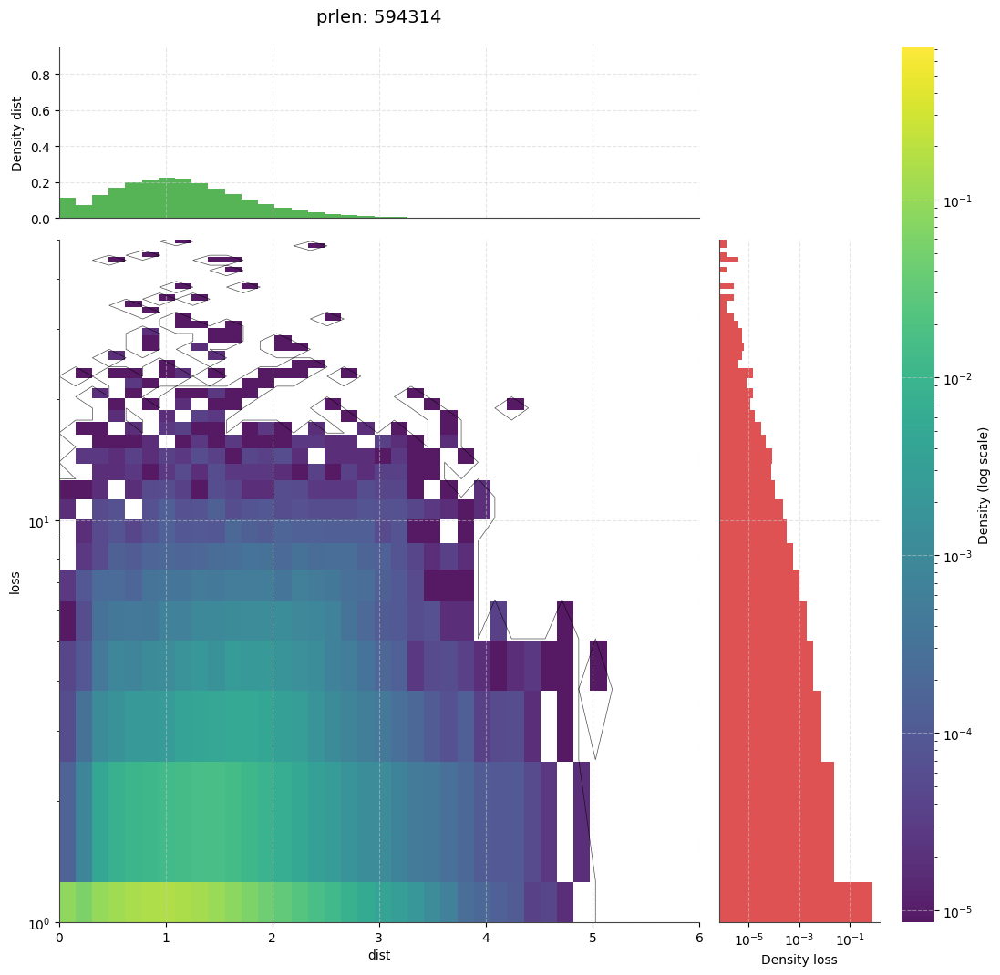

In [419]:
D2hist(pr[:,0], pr[:,1:7].sum(dim=1), 'pr', 'dist','loss') 

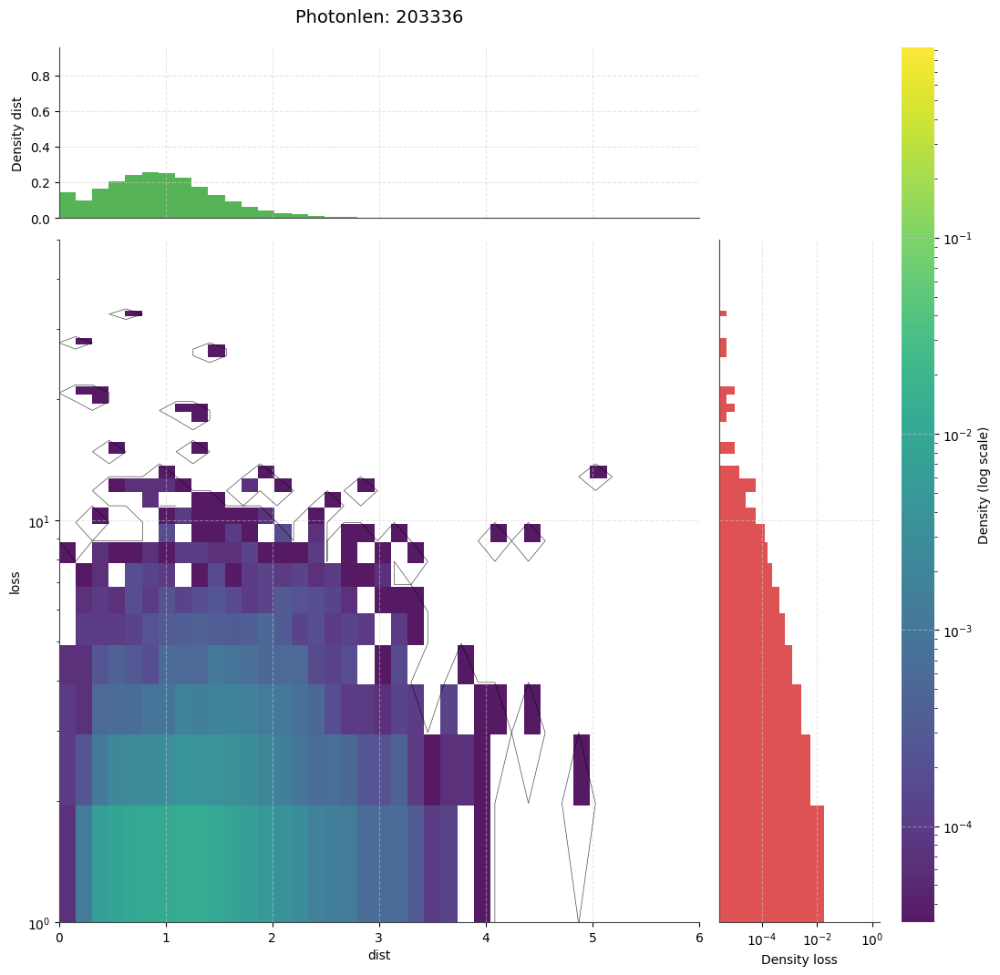

In [420]:
D2hist(photon[:,0], photon[:,1:7].sum(dim=1), 'Photon', 'dist','loss') 

(-1.0, 6.0)

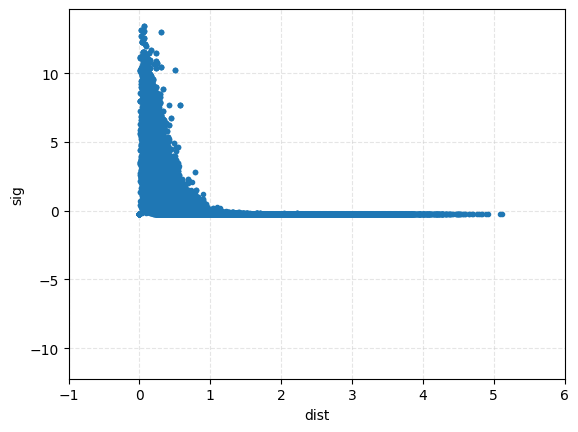

In [239]:
plt.plot(data_dist_loss[:,0], data_dist_loss[:,-1], '.')
plt.xlabel('dist')
plt.ylabel('sig')
plt.xlim(-1,6)

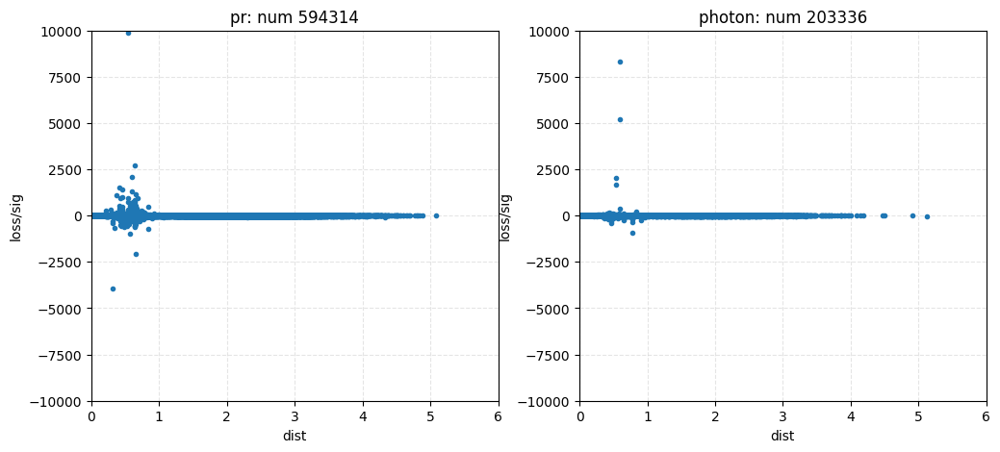

In [479]:
pr=data_dist_loss[data_dist_loss[:,-2]==0]
photon = data_dist_loss[data_dist_loss[:,-2]>0]
fig, axs = plt.subplots(1,2, figsize = (12,5))
def plot_loss_sig(num, data, name):
    axs[num].plot(data[:,0], (data[:,1] + data[:,2])/data[:,-1], '.')
    axs[num].set_xlabel('dist')
    axs[num].set_ylabel('loss/sig')
    axs[num].set_title(f'{name}: num {len(data)}')
    axs[num].set_xlim(0,6)
    axs[num].set_ylim(-1e4,1e4)
plot_loss_sig(0, pr, 'pr')
plot_loss_sig(1, photon, 'photon')

In [ ]:
import random
def plot_loss_sig(num, data_all, name, k=1e5):
    data = data_all[data_all[:,0]<7]
    data = torch.concat([i.unsqueeze(0) for  i in random.choices(data, k=int(1e5))])
    axs[num].plot(data[:,0], (data[:,1] + data[:,2])/torch.abs(data[:,-1]), '.')
    axs[num].set_xlabel('dist')
    axs[num].set_ylabel('loss/sig')
    axs[num].set_title(f'{name}: num {len(data)}')
    axs[num].set_xlim(0,6)
    axs[num].set_ylim(-1,1000)
fig, axs = plt.subplots(1,2, figsize = (12,5))
plot_loss_sig(0, pr, 'pr')
plot_loss_sig(1, photon, 'photon')

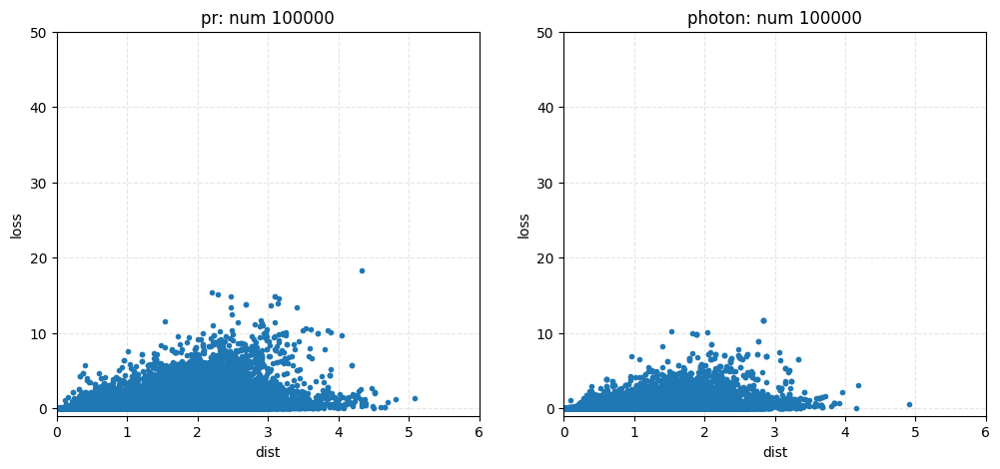

In [482]:
import random
def plot_loss_sig(num, data_all, name, k=1e5):
    data = data_all[data_all[:,0]<7]
    data = torch.concat([i.unsqueeze(0) for  i in random.choices(data, k=int(1e5))])
    axs[num].plot(data[:,0], (data[:,1] + data[:,2]), '.')#/torch.abs(data[:,-1]
    axs[num].set_xlabel('dist')
    axs[num].set_ylabel('loss')
    axs[num].set_title(f'{name}: num {len(data)}')
    axs[num].set_xlim(0,6)
    axs[num].set_ylim(-1,50)
fig, axs = plt.subplots(1,2, figsize = (12,5))
plot_loss_sig(0, pr, 'pr')
plot_loss_sig(1, photon, 'photon')

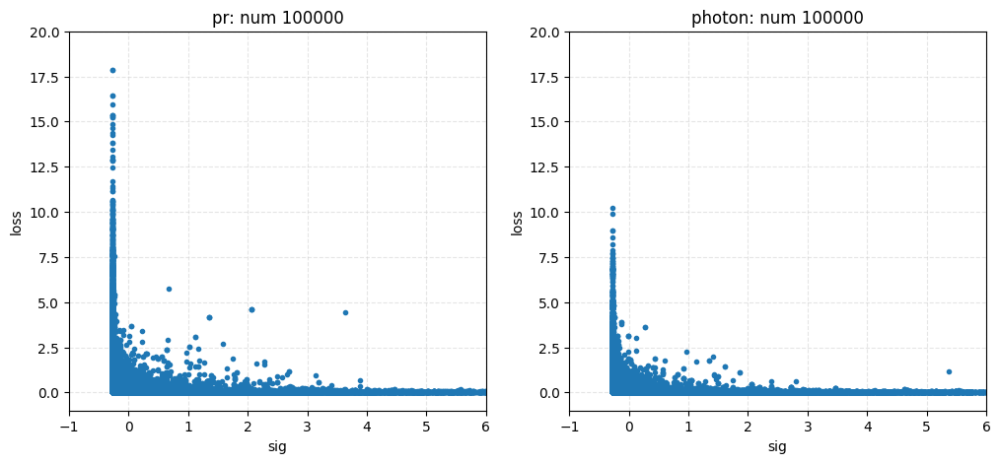

In [481]:
def plot_loss_sig(num, data_all, name, k=1e5):
    data = data_all[data_all[:,0]<7]
    data = torch.concat([i.unsqueeze(0) for  i in random.choices(data, k=int(1e5))])
    axs[num].plot(data[:,-1], (data[:,1] + data[:,2]), '.')#/torch.abs(data[:,-1]
    axs[num].set_xlabel('sig')
    axs[num].set_ylabel('loss')
    axs[num].set_title(f'{name}: num {len(data)}')
    axs[num].set_xlim(-1,6)
    axs[num].set_ylim(-1,20)
fig, axs = plt.subplots(1,2, figsize = (12,5))
plot_loss_sig(0, pr, 'pr')
plot_loss_sig(1, photon, 'photon')

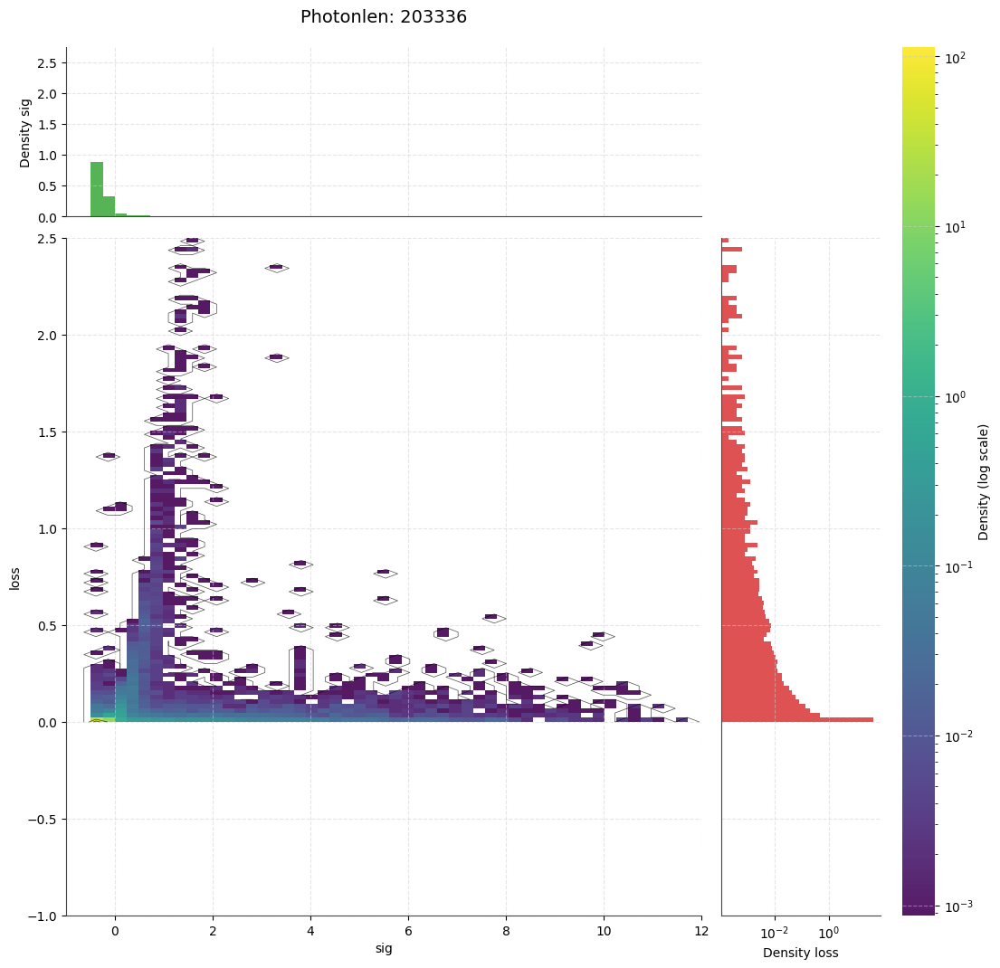

In [466]:
D2hist(photon[:,-1], photon[:, 4], 'Photon', 'sig','loss', xlim=(-1,12), ylim = (-1, 2.5), ylog=False, bins=(100,500)) 

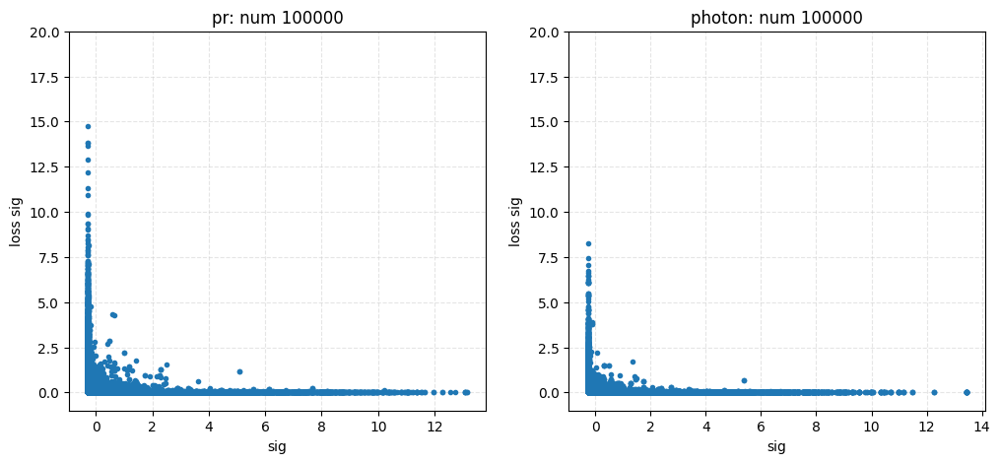

In [437]:
def plot_loss_sig(num, data_all, name, k=1e5):
    data = data_all[data_all[:,0]<7]
    data = torch.concat([i.unsqueeze(0) for  i in random.choices(data, k=int(1e5))])
    axs[num].plot(data[:,-1], (data[:,1]), '.')#/torch.abs(data[:,-1]
    axs[num].set_xlabel('sig')
    axs[num].set_ylabel('loss sig')
    axs[num].set_title(f'{name}: num {len(data)}')
    # axs[num].set_xlim(0,6)
    axs[num].set_ylim(-1,20)
fig, axs = plt.subplots(1,2, figsize = (12,5))
plot_loss_sig(0, pr, 'pr')
plot_loss_sig(1, photon, 'photon')

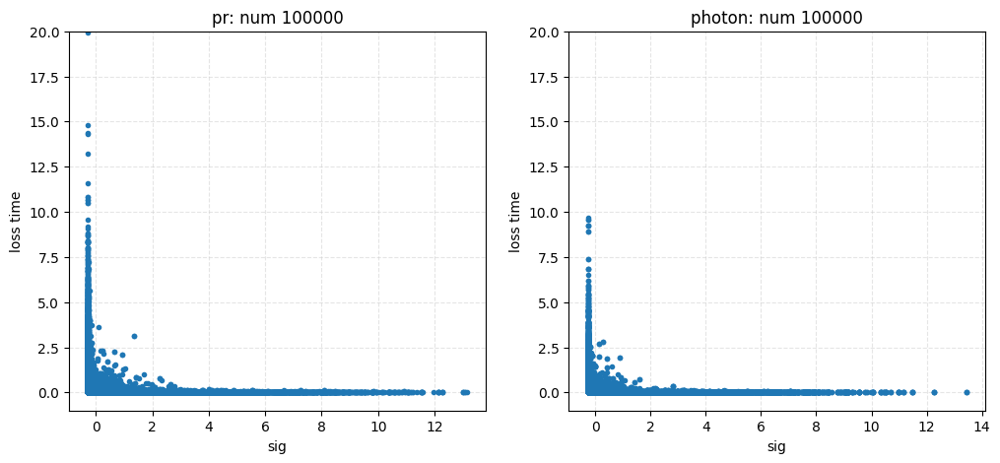

In [438]:
def plot_loss_sig(num, data_all, name, k=1e5):
    data = data_all[data_all[:,0]<7]
    data = torch.concat([i.unsqueeze(0) for  i in random.choices(data, k=int(1e5))])
    axs[num].plot(data[:,-1], (data[:,2]), '.')#/torch.abs(data[:,-1]
    axs[num].set_xlabel('sig')
    axs[num].set_ylabel('loss time')
    axs[num].set_title(f'{name}: num {len(data)}')
    # axs[num].set_xlim(0,6)
    axs[num].set_ylim(-1,20)
fig, axs = plt.subplots(1,2, figsize = (12,5))
plot_loss_sig(0, pr, 'pr')
plot_loss_sig(1, photon, 'photon')

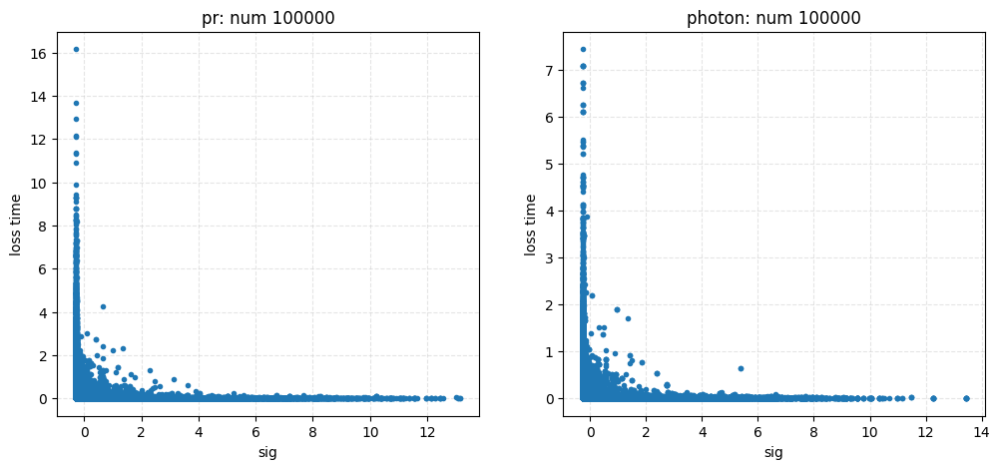

In [447]:
def plot_loss_sig(num, data_all, name, k=1e5, i = 0):
    data = data_all[data_all[:,0]<7]
    data = torch.concat([i.unsqueeze(0) for  i in random.choices(data, k=int(1e5))])
    axs[num].plot(data[:,-1], (data[:,i+1]), '.')#/torch.abs(data[:,-1]
    axs[num].set_xlabel('sig')
    axs[num].set_ylabel('loss time')
    axs[num].set_title(f'{name}: num {len(data)}')
    # axs[num].set_xlim(0,6)
    # axs[num].set_ylim(-1,20)
fig, axs = plt.subplots(1,2, figsize = (12,5))
plot_loss_sig(0, pr, 'pr')
plot_loss_sig(1, photon, 'photon')


# PER LOSS 
X

Y

Sig

falt

real-falat

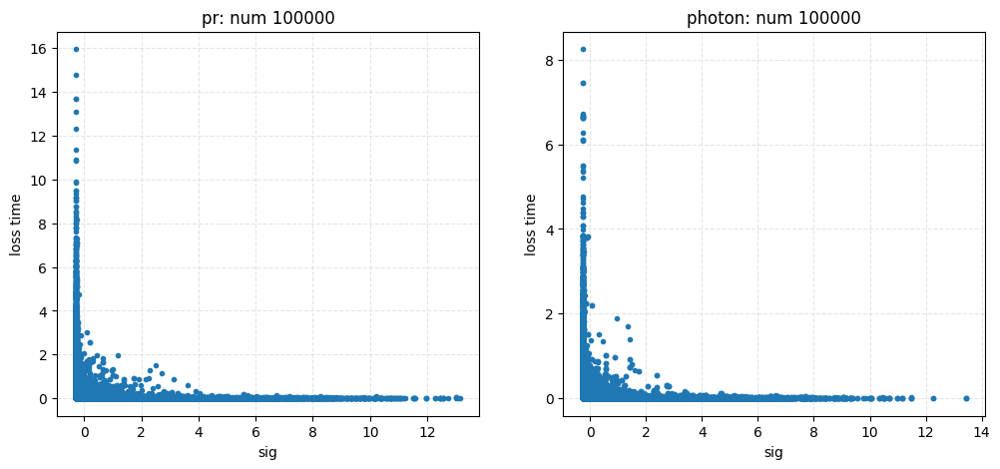

In [448]:
# x
fig, axs = plt.subplots(1,2, figsize = (12,5))
plot_loss_sig(0, pr, 'pr', i = 0)
plot_loss_sig(1, photon, 'photon', i = 0)

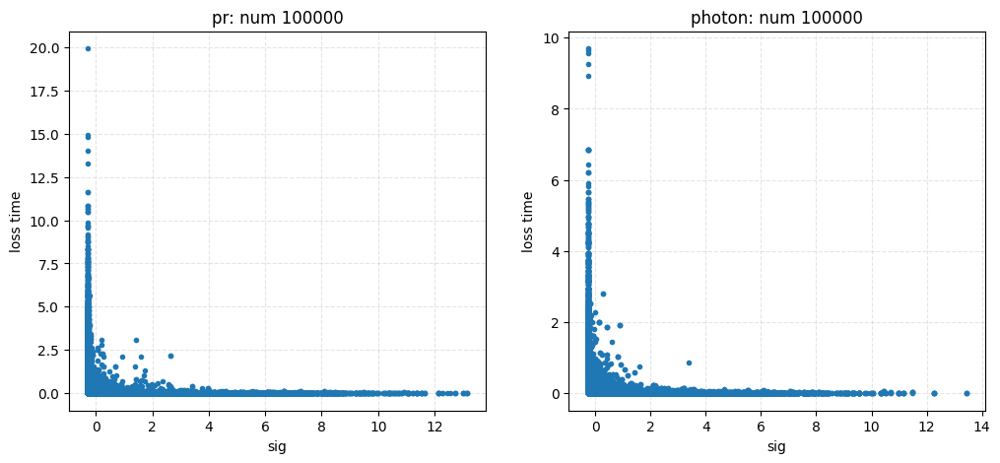

In [449]:
fig, axs = plt.subplots(1,2, figsize = (12,5))
plot_loss_sig(0, pr, 'pr', i = 1)
plot_loss_sig(1, photon, 'photon', i = 1)

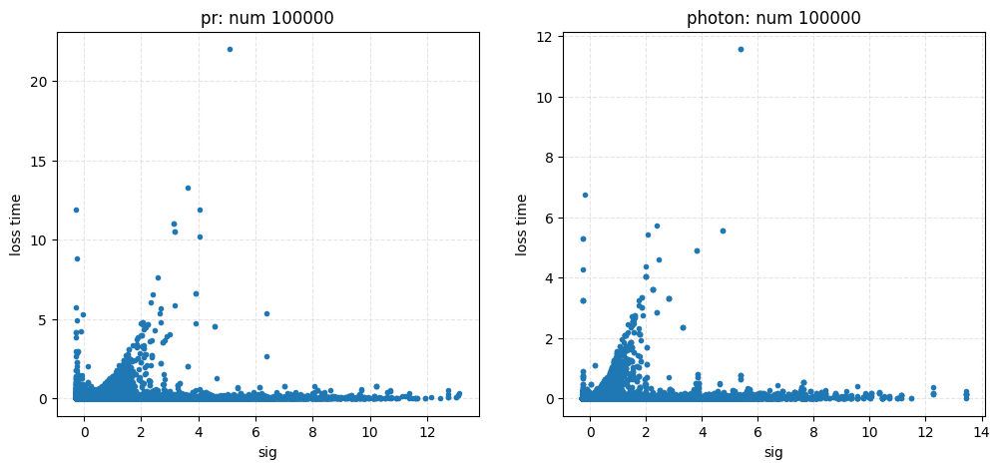

In [450]:
fig, axs = plt.subplots(1,2, figsize = (12,5))
plot_loss_sig(0, pr, 'pr', i = 3)
plot_loss_sig(1, photon, 'photon', i = 3)

(-0.1, 1.0)

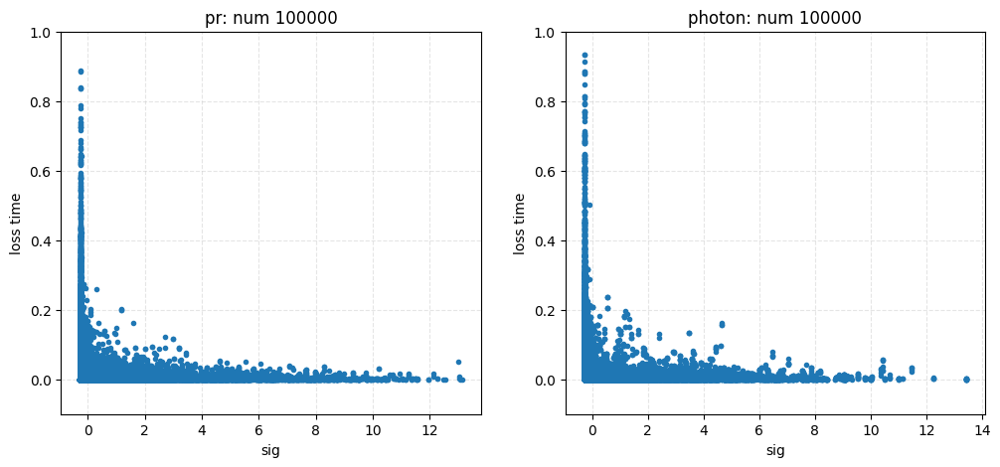

In [460]:
fig, axs = plt.subplots(1,2, figsize = (12,5))
plot_loss_sig(0, pr, 'pr', i = 4)
plot_loss_sig(1, photon, 'photon', i = 4)
axs[0].set_ylim(-0.1,1)
axs[1].set_ylim(-0.1,1)

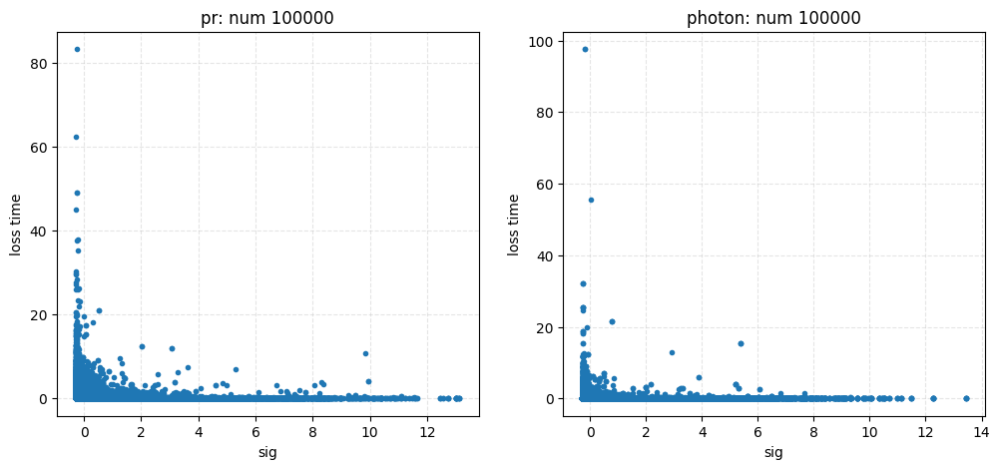

In [452]:
fig, axs = plt.subplots(1,2, figsize = (12,5))
plot_loss_sig(0, pr, 'pr', i = 5)
plot_loss_sig(1, photon, 'photon', i = 5)

In [454]:
data = pr
for i in np.arange(6):
    print('mean', data[:,i+1].mean())

mean tensor(0.0527, dtype=torch.float64)
mean tensor(0.0554, dtype=torch.float64)
mean tensor(0., dtype=torch.float64)
mean tensor(0.0069, dtype=torch.float64)
mean tensor(0.0054, dtype=torch.float64)
mean tensor(0.1020, dtype=torch.float64)


In [455]:
data = photon
for i in np.arange(6):
    print('mean', data[:,i+1].mean())

mean tensor(0.0252, dtype=torch.float64)
mean tensor(0.0294, dtype=torch.float64)
mean tensor(0., dtype=torch.float64)
mean tensor(0.0058, dtype=torch.float64)
mean tensor(0.0058, dtype=torch.float64)
mean tensor(0.0508, dtype=torch.float64)


## 2d hists

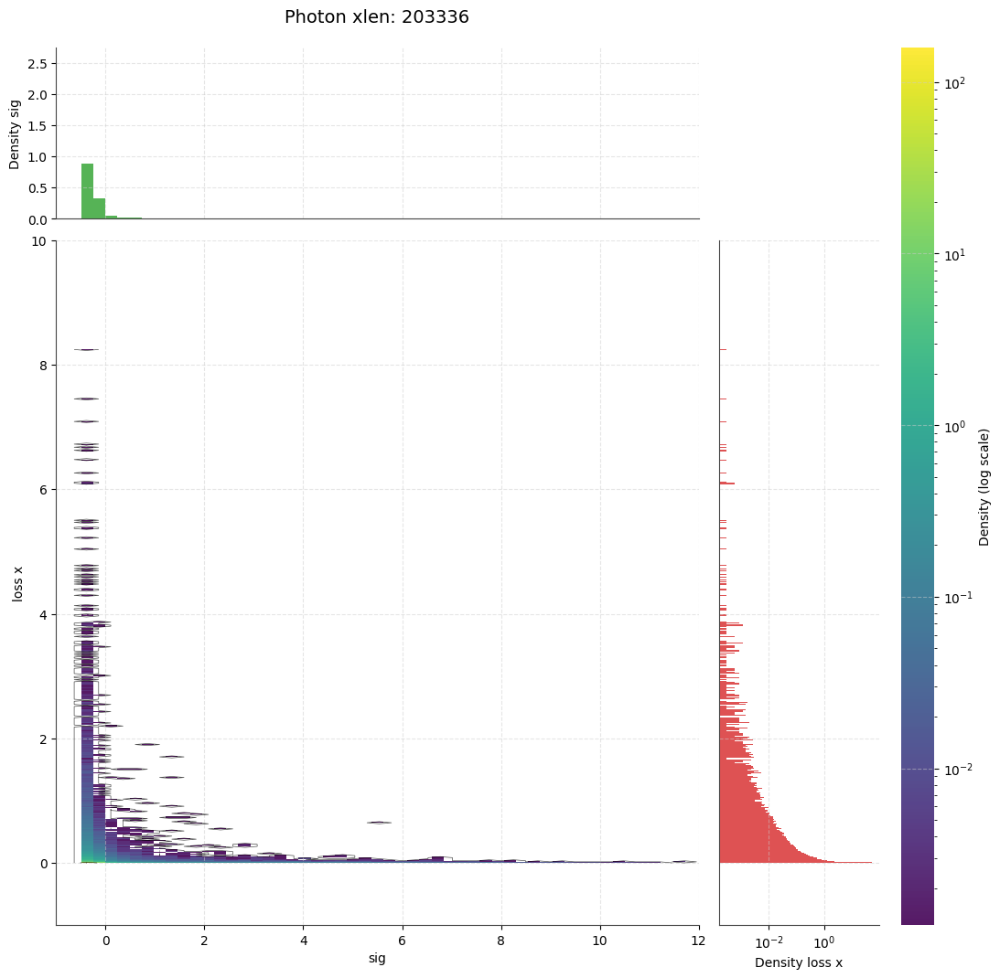

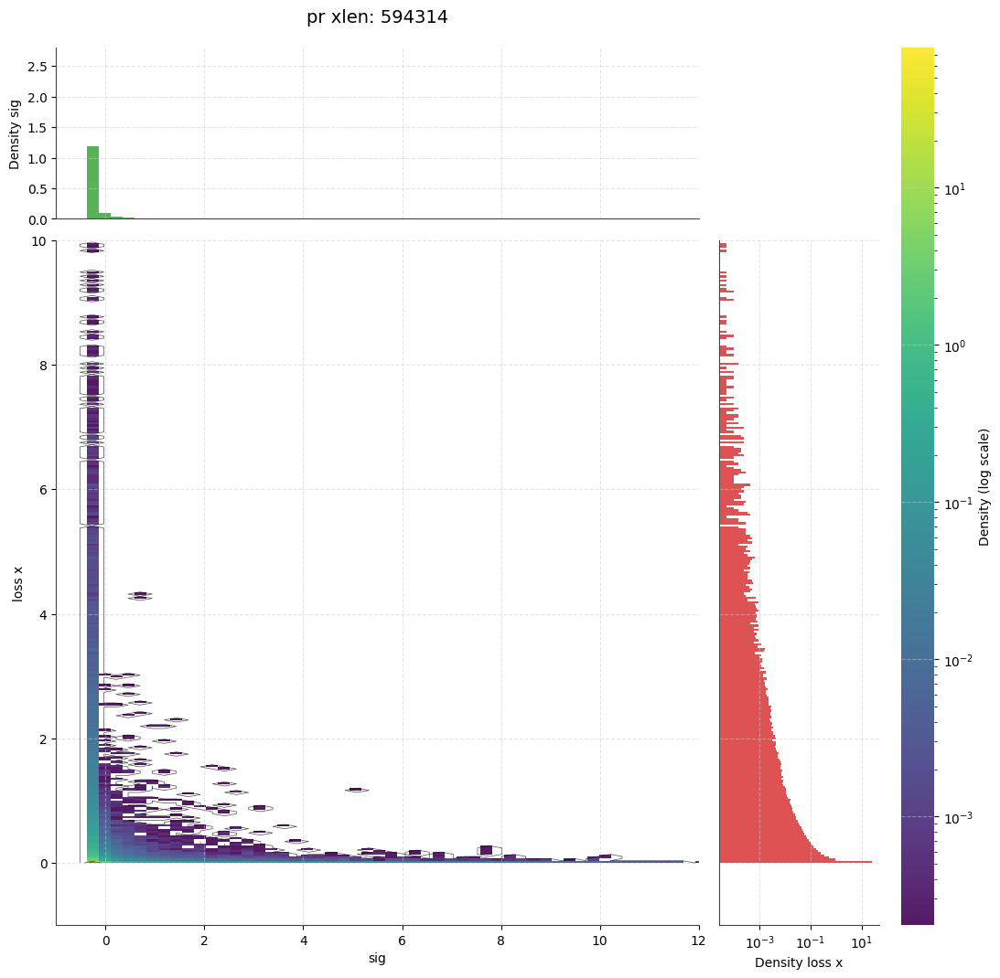

In [488]:
val='x'
i=0
D2hist(photon[:,-1], photon[:, i+1], 'Photon ' + val, 'sig','loss '+ val, xlim=(-1,12), ylim = (-1, 10), ylog=False, xlog=False, bins=(100,500)) 
D2hist(pr[:,-1], pr[:, i+1], 'pr ' + val, 'sig','loss '+ val, xlim=(-1,12), ylim = (-1, 10), ylog=False, bins=(100,500), xlog=False) 

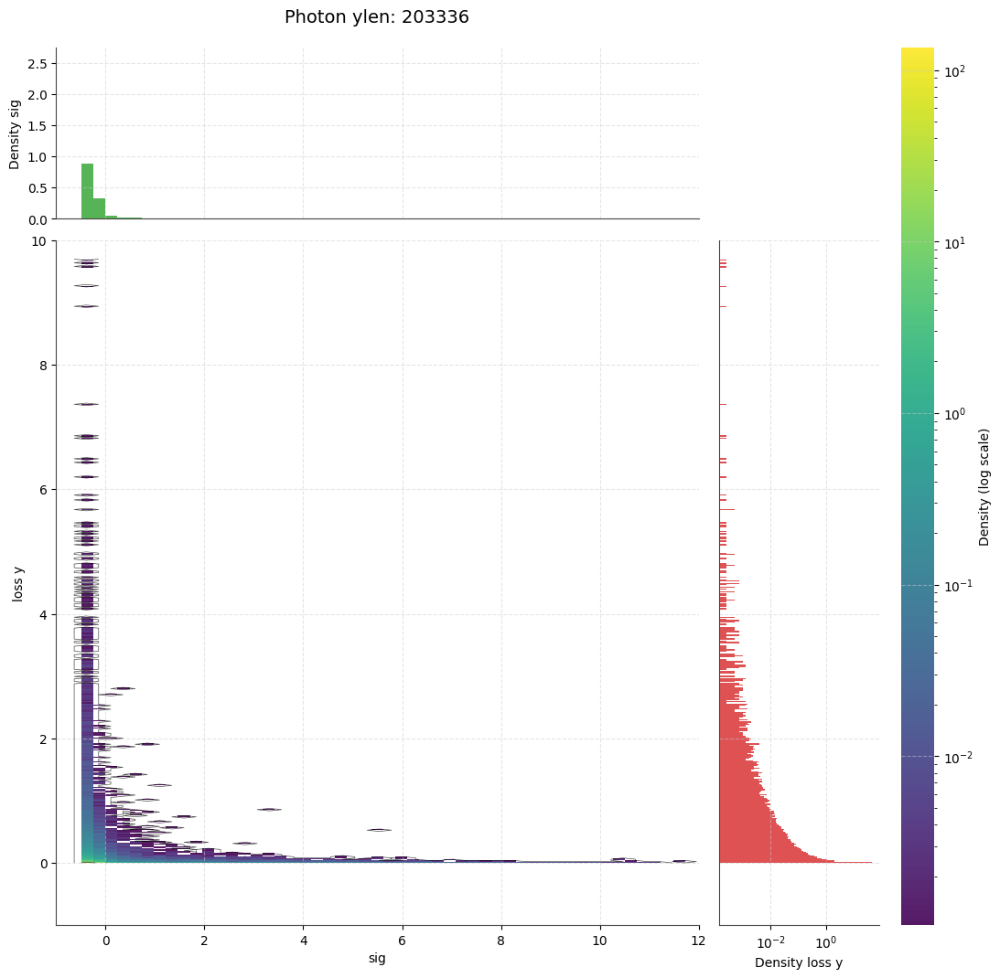

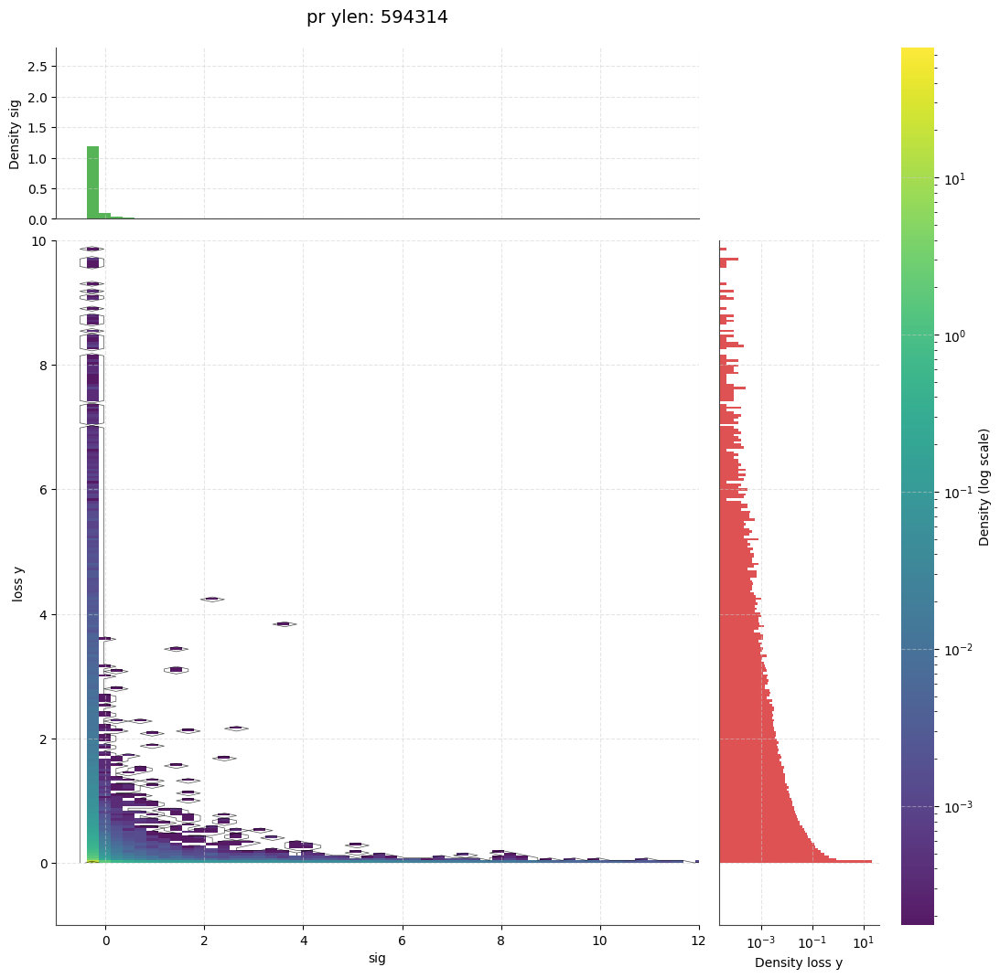

In [474]:
val='y'
i=1
D2hist(photon[:,-1], photon[:, i+1], 'Photon ' + val, 'sig','loss '+ val, xlim=(-1,12), ylim = (-1, 10), ylog=False, bins=(100,500)) 
D2hist(pr[:,-1], pr[:, i+1], 'pr ' + val, 'sig','loss '+ val, xlim=(-1,12), ylim = (-1, 10), ylog=False, bins=(100,500)) 

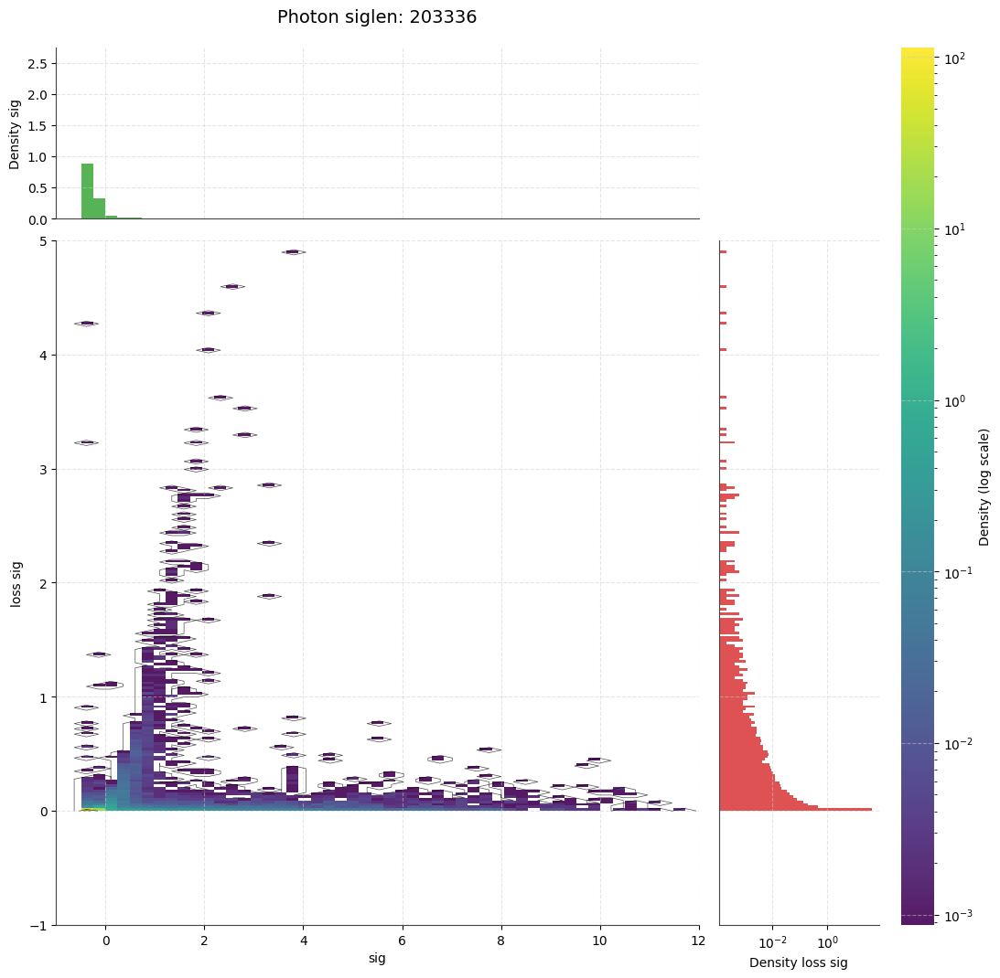

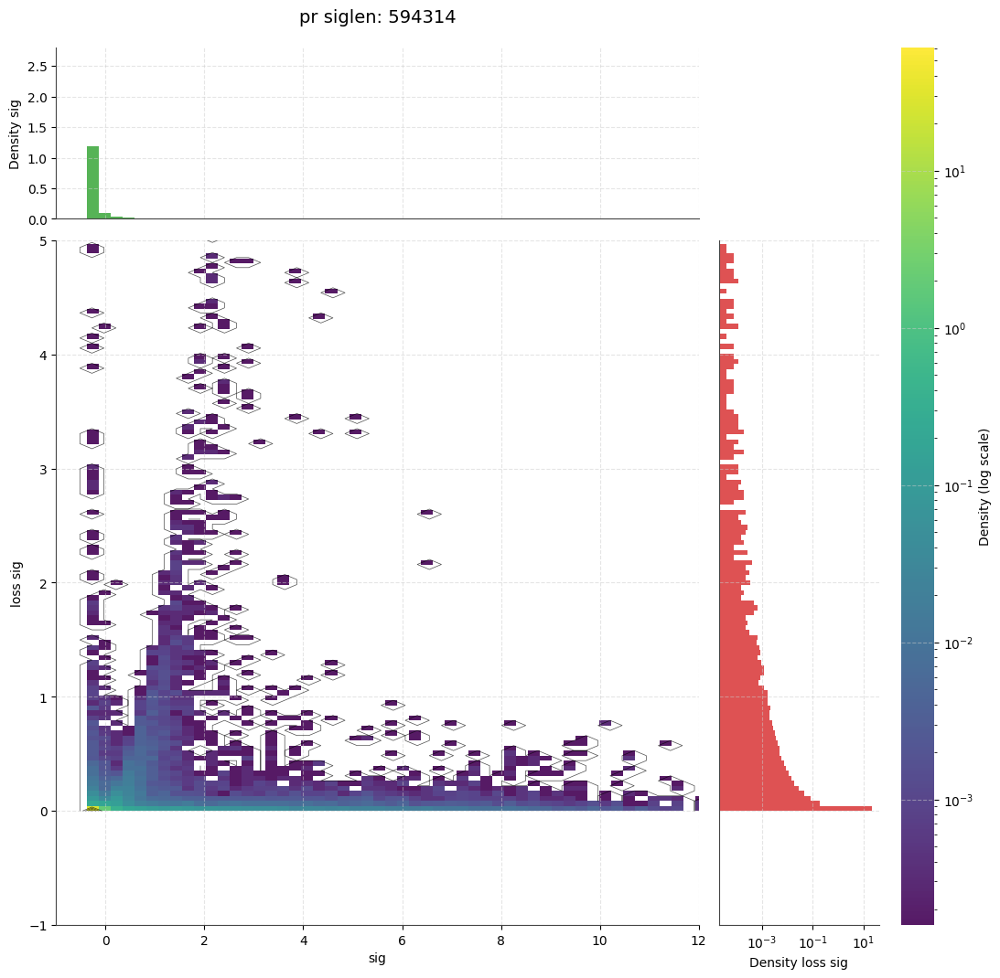

In [475]:
val='sig'
i=3
D2hist(photon[:,-1], photon[:, i+1], 'Photon ' + val, 'sig','loss '+ val, xlim=(-1,12), ylim = (-1, 5), ylog=False, bins=(100,500)) 
D2hist(pr[:,-1], pr[:, i+1], 'pr ' + val, 'sig','loss '+ val, xlim=(-1,12), ylim = (-1, 5), ylog=False, bins=(100,500)) 

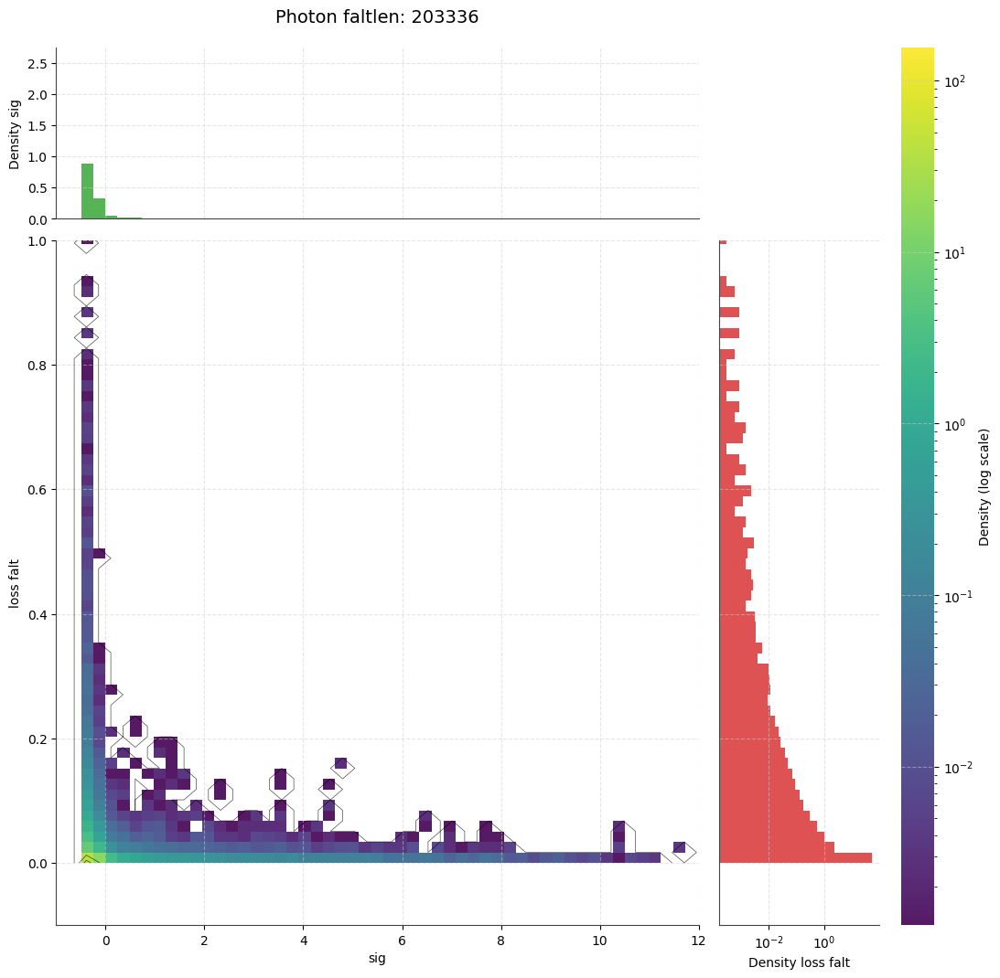

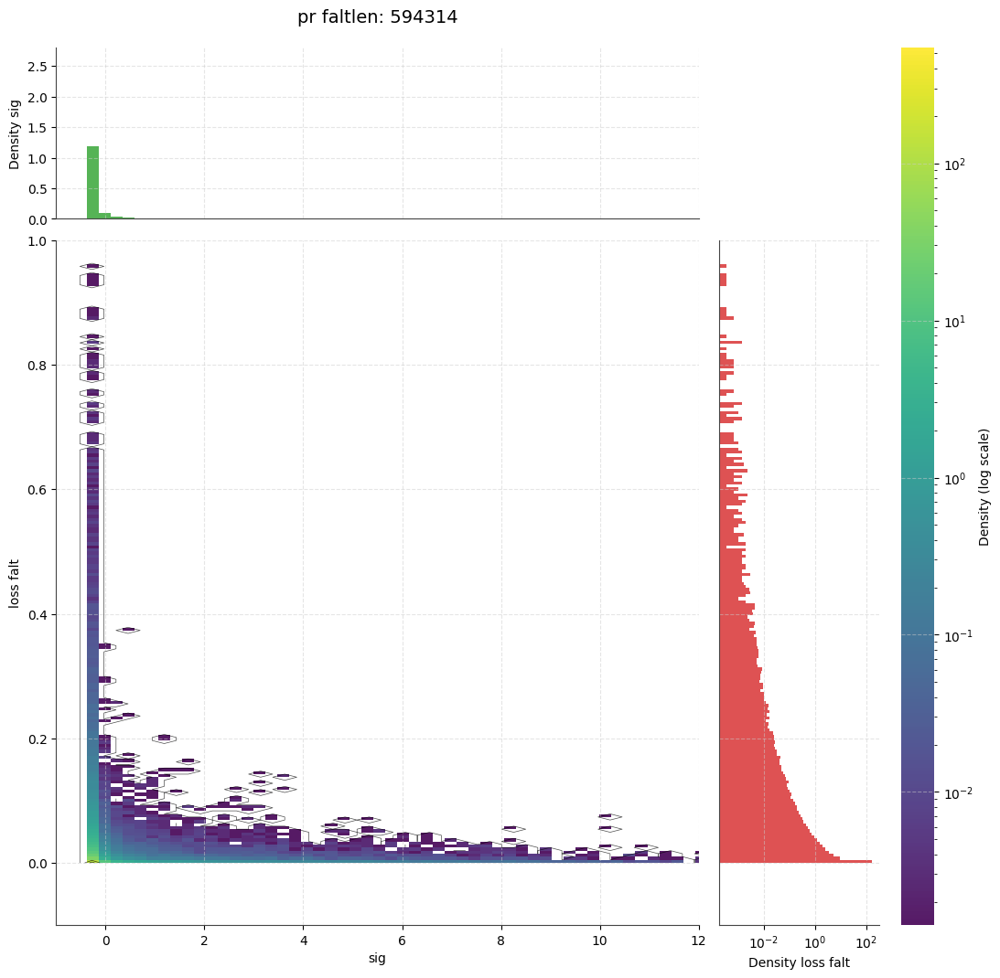

In [476]:
val='falt'
i=4
D2hist(photon[:,-1], photon[:, i+1], 'Photon ' + val, 'sig','loss '+ val, xlim=(-1,12), ylim = (-0.1, 1), ylog=False, bins=(100,500)) 
D2hist(pr[:,-1], pr[:, i+1], 'pr ' + val, 'sig','loss '+ val, xlim=(-1,12), ylim = (-0.1, 1), ylog=False, bins=(100,500)) 

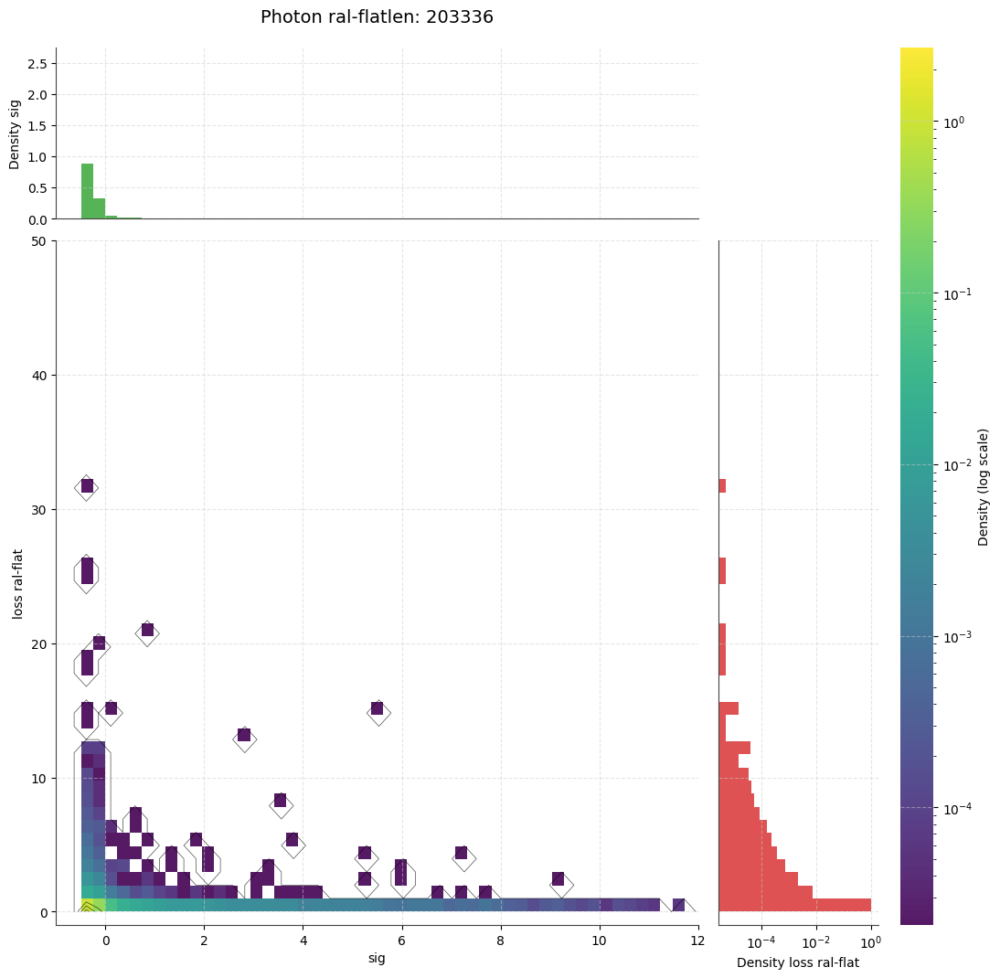

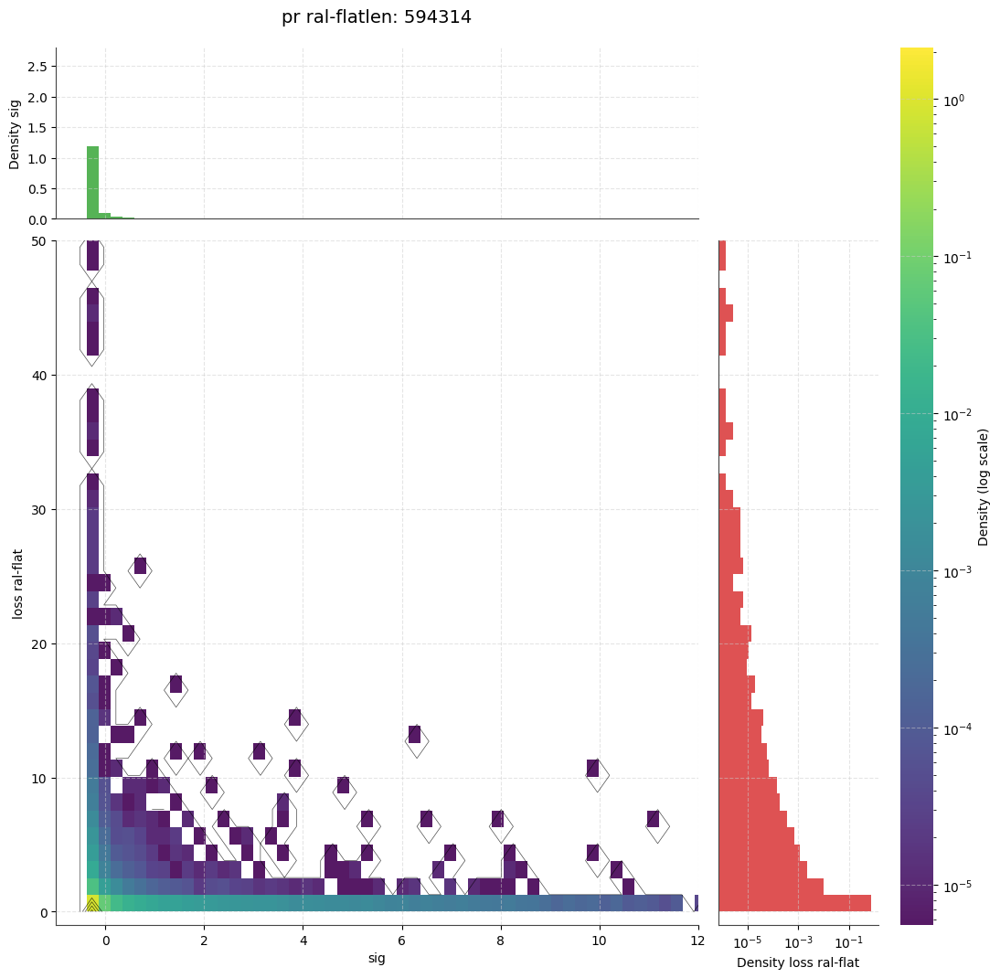

In [484]:
val='ral-flat'
i=5
D2hist(photon[:,-1], photon[:, i+1], 'Photon ' + val, 'sig','loss '+ val, xlim=(-1,12), ylim = (-1, 50), ylog=False, bins=(100,100)) 
D2hist(pr[:,-1], pr[:, i+1], 'pr ' + val, 'sig','loss '+ val, xlim=(-1,12), ylim = (-1, 50), ylog=False, bins=(100,100)) 

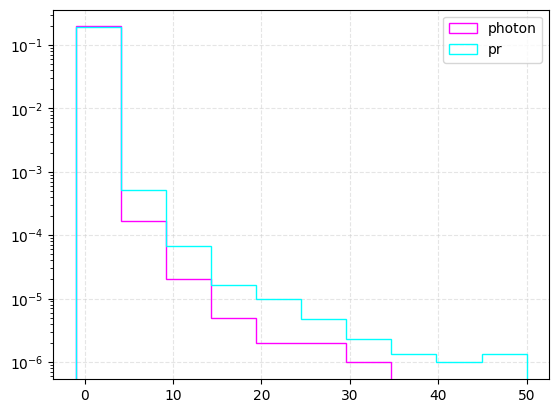

In [500]:
i=5
# D2hist(photon[:,-1], photon[:, i+1], 'Photon ' + val, 'sig','loss '+ val, xlim=(-1,12), ylim = (-1, 50), ylog=False, bins=(100,100)) 
# D2hist(pr[:,-1], pr[:, i+1], 'pr ' + val, 'sig','loss '+ val, xlim=(-1,12), ylim = (-1, 50), ylog=False, bins=(100,100)) 
plt.hist( photon[photon[:,0]>0][:, i+1], range=(-1,50), color = (1.0,0,1.0,1), label = 'photon', log=True, density=True,histtype='step')
plt.hist( pr[pr[:,0]>0][:, i+1], range=(-1,50), color = (0,1.0,1.0,1), label = 'pr', log=True, density=True,histtype='step')
plt.legend()

## Что за ошибки на малых сигналах

In [561]:
latent_list_2, recon__list, particles_2, all_losss_2 = model.predict(NoneLoss = True)

  0%|                                                                                                                                                                                   | 0/390 [00:00<?, ?it/s]/home/rfit/Telescope_Array/phd_work/src/train_VAE/model.py:104: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  mass = self.sofrmax(mass)
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 183/183 [00:34<00:00,  5.34it/s]


In [562]:
len(all_losss_2),all_losss_2[0].shape

(573, torch.Size([2000, 76, 6]))

In [525]:
def calc_det(x: torch.Tensor, mask_v: float = -11.0, start_stop_teken: bool = True, use_mask: bool = True) -> torch.Tensor:
    """
    Вычисляет маску активных детекторов или число детекторов на событие.

    Аргументы:
        x (Tensor): Входной тензор (batch, det, feat).
        mask_v (float): Значение, используемое как маска (например, -10).
        start_stop_teken (bool): Если True, обнуляет start/stop токены.
        use_mask (bool): Если False — возвращает число детекторов на событие.

    Возвращает:
        Tensor: маска или числа детекторов.
    """
    # Определим маску: 1 там, где не маска, 0 — где паддинг
    mask = torch.where(x != mask_v, 1, 0)

    # Если нужно убрать start/stop токены
    if start_stop_teken:
        mask[:, 0] = 0  # начало
        num_det = torch.sum(mask, dim=1)
        batch = num_det.shape[0]
        # занулим стоп-токен
        mask[torch.arange(batch), num_det[:, 0], :] = 0
        num_det = torch.sum(mask, dim=1)  # пересчитаем
        return mask

    if use_mask:
        return mask
    else:
        # просто вернем количество активных детекторов
        return torch.sum(mask, dim=1)

In [530]:
x[0].shape

torch.Size([74, 6])

In [549]:
calc_det(x)[0].shape

torch.Size([76, 6])

In [545]:
x[0][calc_det(x)[0].to(torch.bool)]

tensor([ 1.8071,  0.6266, -0.5892, -0.2737, -1.6578,  0.0601,  1.0094,  0.6266,
        -0.5840, -0.2719, -0.9520, -0.6918,  1.0048, -0.1733, -0.6981, -0.2724,
        -0.6338, -0.7079,  0.2048,  0.6318, -0.5503, -0.2622, -0.2426, -0.8217,
         0.2029, -0.1718, -0.6578, -0.1159,  0.0745, -0.8365,  0.2033, -0.9731,
        -0.7981, -0.2735,  0.3891, -0.5986, -0.5986,  0.6298, -0.5011, -0.2728,
         0.4683, -0.5604, -0.5984, -0.1715, -0.6014, -0.2496,  0.7825, -0.8281,
        -1.4012, -0.9689, -0.6356, -0.2737,  1.8046, -0.6533])

In [582]:
# test:
#   - pr
#   - photon

original = {'pr':[],
           'photon':[]}
reconstruction = {'pr':[],
           'photon':[]}
loss_all ={'pr':[],
           'photon':[]}
num=0
n = 0
keys = list(original.keys())
for i, test_loader in enumerate(model.val_loaders):
    for j, (x, part, _) in enumerate(tqdm(test_loader)):
        recon = recon__list[n]
        loss = all_losss_2[n]
        n+=1
        mask = calc_det(x).to(torch.bool)
        for k, event in enumerate(x):
            ev = event[mask[k][:,0]]
            recon_env = recon[k][mask[k][:,0]]
            original[keys[i]].append(ev)
            reconstruction[keys[i]].append(recon_env)
            loss_env = loss[k][mask[k][:,0]]
            loss_all[keys[i]].append(loss_env)
            num+=len(ev)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 183/183 [00:31<00:00,  5.85it/s]


In [581]:
event[mask[k][:,0]]

tensor([[-2.4845, -0.4497, -0.5409, -0.2737, -2.5430, -0.1332],
        [-1.6921,  0.3306, -0.3957, -0.2716, -1.6815, -0.3941],
        [-0.8919, -0.4465, -0.5554, -0.2714, -0.7958, -0.8184],
        [-0.8815, -1.2516, -0.5580, -0.2732, -0.7786, -0.6822],
        [-0.8510,  0.3364, -0.4769, -0.2653, -0.7576, -0.8413],
        [-0.2148,  1.3249, -0.5042, -0.2736, -0.0663, -0.7123],
        [-0.0785,  0.3466, -0.5290, -0.2355,  0.0904, -0.8417],
        [-0.0789, -0.4548, -0.5384, -0.2557,  0.0957, -0.8253],
        [ 0.7234,  0.3489, -0.5375, -0.2657,  0.9702, -0.8076],
        [ 1.5260,  0.3431, -0.6416, -0.2737,  1.8520, -0.7361],
        [ 2.3290,  0.3441, -0.6570, -0.2735,  2.7332, -0.6637]])

  0%|▌                                                                                                                                                                 | 2639/779074 [00:00<00:30, 25062.88it/s]


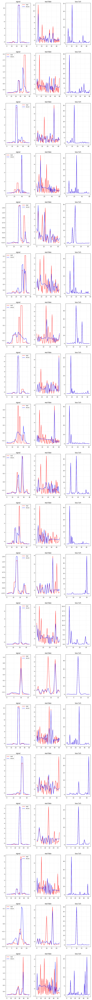

In [588]:
# pr
part = 'pr'
num=20
fig, axs = plt.subplots(num,3,figsize= (12, 7*num))
n=0
th=20
for i in tqdm(np.arange(len(original[part]))):
    real = original[part][i]
    l = loss_all[part][i]
    recon = reconstruction[part][i]
    if l[:,5].max() > th:
        axs[n][0].plot(real[:,3], 'r', label='real')
        axs[n][0].plot(recon[:,3], 'b', label='recon')
        axs[n][1].plot(real[:,5], 'r', label='real')
        axs[n][1].plot(recon[:,5], 'b', label='recon')
        axs[n][2].plot(l[:,5], 'r', label='real')
        axs[n][2].plot(l[:,5], 'b', label='recon')
        axs[n][0].set_title('signal')
        axs[n][1].set_title('real-fake')
        axs[n][2].set_title('loss 5ch')
        axs[n][0].legend()
        n+=1
        if n==num:
            break
        
    

  2%|███▊                                                                                                                                                              | 8610/364387 [00:00<00:10, 34778.27it/s]


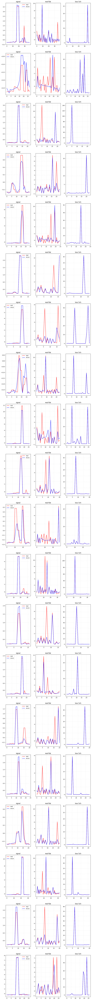

In [592]:
#photon
part = 'photon'
num=20
fig, axs = plt.subplots(num,3,figsize= (12, 7*num))
n=0
th=20
for i in tqdm(np.arange(len(original[part]))):
    real = original[part][i]
    l = loss_all[part][i]
    recon = reconstruction[part][i]
    if l[:,5].max() > th:
        axs[n][0].plot(real[:,3], 'r', label='real')
        axs[n][0].plot(recon[:,3], 'b', label='recon')
        axs[n][1].plot(real[:,5], 'r', label='real')
        axs[n][1].plot(recon[:,5], 'b', label='recon')
        axs[n][2].plot(l[:,5], 'r', label='real')
        axs[n][2].plot(l[:,5], 'b', label='recon')
        axs[n][0].set_title('signal')
        axs[n][1].set_title('real-flat')
        axs[n][2].set_title('loss 5ch')
        axs[n][0].legend()
        n+=1
        if n==num:
            break
        

А что в других каналах??

 57%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 209343/364387 [00:03<00:02, 61057.80it/s]


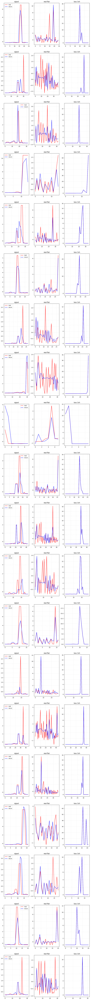

In [593]:
#photon
part = 'photon'
num=20
fig, axs = plt.subplots(num,3,figsize= (12, 7*num))
n=0
th=10
for i in tqdm(np.arange(len(original[part]))):
    real = original[part][i]
    l = loss_all[part][i]
    recon = reconstruction[part][i]
    if l[:,3].max() > th:
        axs[n][0].plot(real[:,3], 'r', label='real')
        axs[n][0].plot(recon[:,3], 'b', label='recon')
        axs[n][1].plot(real[:,5], 'r', label='real')
        axs[n][1].plot(recon[:,5], 'b', label='recon')
        axs[n][2].plot(l[:,3], 'r', label='real')
        axs[n][2].plot(l[:,3], 'b', label='recon')
        axs[n][0].set_title('signal')
        axs[n][1].set_title('real-flat')
        axs[n][2].set_title('loss 3ch')
        axs[n][0].legend()
        n+=1
        if n==num:
            break
        

### ПОсмотрим по всем каналам что происходит

  2%|███▊                                                                                                                                                              | 8610/364387 [00:00<00:23, 15449.73it/s]


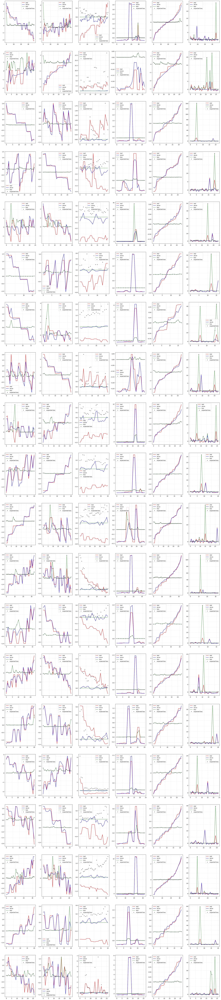

In [600]:
#photon
part = 'photon'
num=20
fig, axs = plt.subplots(num,6,figsize= (30, 7*num))
n=0
th=20
for i in tqdm(np.arange(len(original[part]))):
    real = original[part][i]
    l = loss_all[part][i]
    recon = reconstruction[part][i]
    if l[:,5].max() > th:
        for j in np.arange(6):
            axs[n][j].plot(real[:,j], 'r', label='real')
            axs[n][j].plot(recon[:,j], 'b', label='recon')
            axs[n][j].plot(l[:,j], '--g', label='loss')
            axs[n][j].plot(np.power(real[:,j]-recon[:,j], 2), '+k', label='ecpected loss')
            axs[n][j].legend()
        n+=1
        if n==num:
            break
        

  2%|▊                                 | 8610/364387 [00:00<00:19, 18211.23it/s]


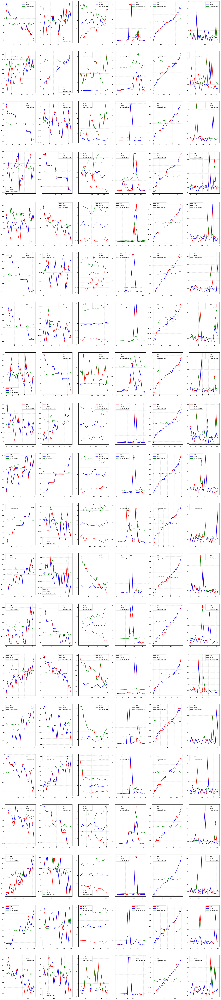

In [612]:
#photon
part = 'photon'
num=20
fig, axs = plt.subplots(num,6,figsize= (30, 7*num))
n=0
th=20
for i in tqdm(np.arange(len(original[part]))):
    real = original[part][i]
    l = loss_all[part][i]
    recon = reconstruction[part][i]
    if l[:,5].max() > th:
        for j in np.arange(6):
            axs[n][j].plot(real[:,j], 'r', label='real')
            axs[n][j].plot(recon[:,j], 'b', label='recon')
            # axs[n][j].plot(l[:,j], '--g', label='loss')
            axs[n][j].plot(np.abs(real[:,j]-recon[:,j]), '--g', label='ecpected loss')
            axs[n][j].legend()
        n+=1
        if n==num:
            break

ЧТО пидно

* все выплески ошибки -- модель не отреагировала на real вспелкс (почему этот вспелск вообще есть?)

Обучение только по последнему каналу дало ошибку на протонах среднюю 8,7e-3. Ее можно счиатать за нижний порог. По фотонам 3,2e-3

In [609]:
long_l = torch.zeros(0,)
for i,l in enumerate(tqdm(loss_all['pr'])):
    long_l = torch.concat((long_l, l[:,5]))
    if i>1e5:
        break
long_l.mean()

 13%|████▏                            | 100001/779074 [00:27<03:08, 3593.47it/s]


tensor(0.3092)

In [610]:
long_l = torch.zeros(0,)
for i,l in enumerate(tqdm(loss_all['photon'])):
    long_l = torch.concat((long_l, l[:,5]))
    if i>1e5:
        break
long_l.mean()

 27%|█████████                        | 100001/364387 [00:16<00:43, 6135.16it/s]


tensor(0.1619)